## Machine Leaning Method

In [21]:
import pandas as pd
import numpy as np

### Read the data

In [22]:
train_df = pd.read_csv("train_df.csv")
test_df = pd.read_csv("test_df.csv")

In [23]:
test_df

,LATITUDE,LONGITUDE,Total N2 Fixation (μmol N m-2 d-1),DATE,YRDY,MLD,CHL,SST,PAR,Salinity,...,coord1,coord2,coord3,month,time_cos,time_sin,log_P,log_N,log_CHL,log_y
0,0.000997,-154.999900,23.092953,2006-08-21,2006233,39.282626,0.207077,27.741251,54.784996,35.240,...,0.000017,-0.422620,0.906307,8,-0.500000,-0.866025,-0.490020,0.038244,-0.683868,1.363479
1,22.750000,-158.000000,75.187035,2005-08-14,2005225,46.160884,0.055314,26.434376,53.250000,34.988,...,0.386711,-0.345463,0.855050,8,-0.500000,-0.866025,-1.191666,-1.394989,-1.257166,1.876143
2,21.000000,-159.000000,188.927822,2003-08-15,2003225,39.243011,0.054018,26.883751,57.124001,35.042,...,0.358368,-0.334565,0.871572,8,-0.500000,-0.866025,-1.072443,-1.012821,-1.267458,2.276296
3,38.464000,-73.300000,531.907504,2009-08-19,2009225,10.202625,0.220413,26.231251,51.389999,31.925,...,0.622023,-0.749974,-0.225003,8,-0.500000,-0.866025,-0.239640,0.218579,-0.656764,2.725836
4,37.855000,-38.642000,132.559691,2009-08-20,2009225,25.805195,0.052617,25.435045,48.073997,36.478,...,0.613665,-0.493047,-0.616701,8,-0.500000,-0.866025,-0.757080,-0.759451,-1.278871,2.122411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164,38.800000,-11.400000,1355.000000,2014-05-29,2014145,30.639709,0.150850,16.869999,50.714001,36.077,...,0.626604,-0.154042,-0.763963,5,-0.866025,0.500000,-1.198368,-0.020452,-0.821456,3.131939
165,22.750000,-158.000000,160.550000,2012-05-02,2012121,29.187469,0.053275,23.314999,55.160000,34.981,...,0.386711,-0.345463,0.855050,5,-0.866025,0.500000,-1.153213,-1.122315,-1.273473,2.205610
166,22.750000,-158.000000,283.150000,2013-05-19,2013137,29.187469,0.042140,26.945000,60.540001,34.981,...,0.386711,-0.345463,0.855050,5,-0.866025,0.500000,-1.151531,-1.107905,-1.375308,2.452017
167,17.194722,135.004444,373.000000,2019-05-20,2019137,19.366902,0.039241,28.934999,52.166000,34.682,...,0.295620,0.675451,0.675555,5,-0.866025,0.500000,-1.224158,-1.339825,-1.406258,2.571709


In [24]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import seaborn as sns

In [25]:
# features and target
env_vars = ['PAR', 'SST', 'log_CHL', 'MLD', 'Salinity', 'DO', 'N_avg', 'P_avg', 'Fe_avg']
base_features = env_vars + ['coord1', 'coord2', 'coord3', 'time_sin', 'time_cos']
target = 'log_y' 

# train and test
X_train = train_df[base_features]
y_train = train_df[target]
X_test = test_df[base_features]
y_test = test_df[target]

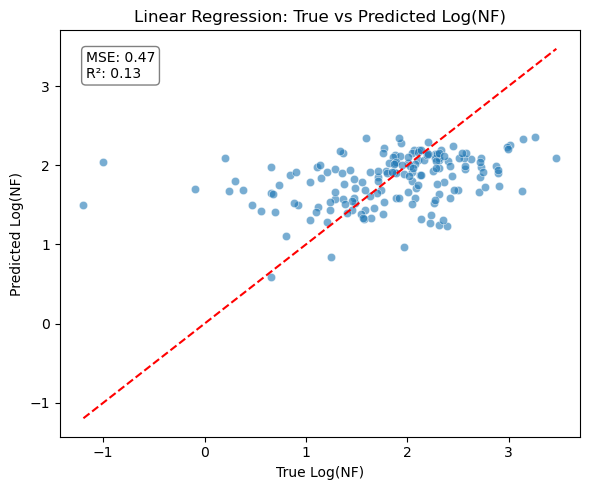

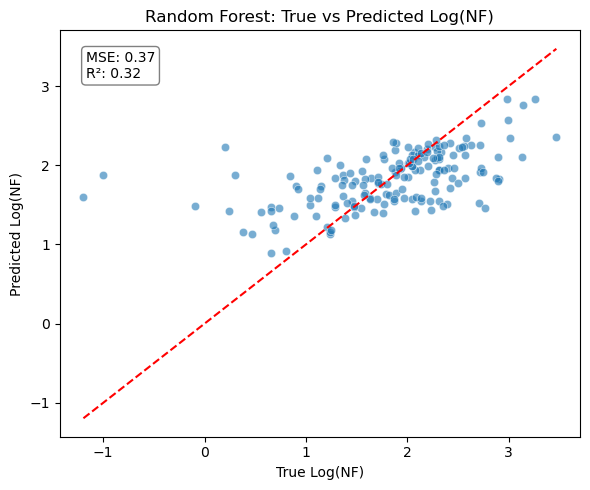

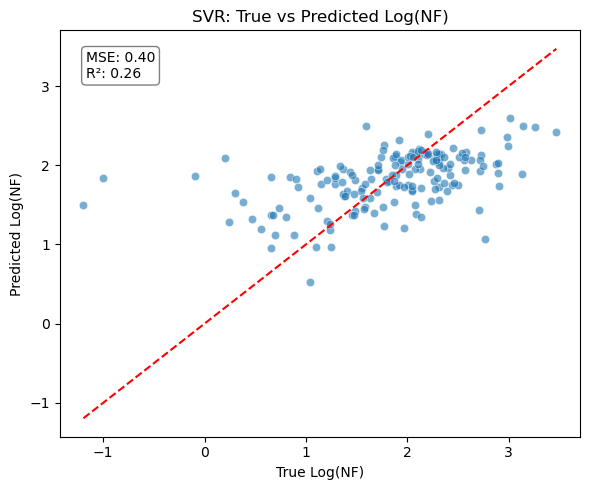

In [26]:
# 模型列表
models = {
    'Linear Regression': make_pipeline(StandardScaler(), LinearRegression()),
    'Random Forest': RandomForestRegressor(n_estimators=300, 
                                           min_samples_split=5, min_samples_leaf=5, 
                                           max_features= 'log2', max_depth=20,         
                                           random_state=42),
    'SVR': make_pipeline(StandardScaler(), SVR(kernel='rbf',
                                               C=53.27328293819941, epsilon=0.5275410183585496, gamma=0.003541912674409519))
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({'Model': name, 'MSE': mse, 'R2': r2})
    
    # 可视化：实际 vs 预测 + 显示 MSE 和 R²
    plt.figure(figsize=(6, 5))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("True Log(NF)")
    plt.ylabel("Predicted Log(NF)")
    plt.title(f'{name}: True vs Predicted Log(NF)')
    
    # 添加 MSE 和 R² 文字标注
    plt.text(
        0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}',
        transform=plt.gca().transAxes,
        fontsize=10, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray')
    )

    plt.tight_layout()
    plt.show()


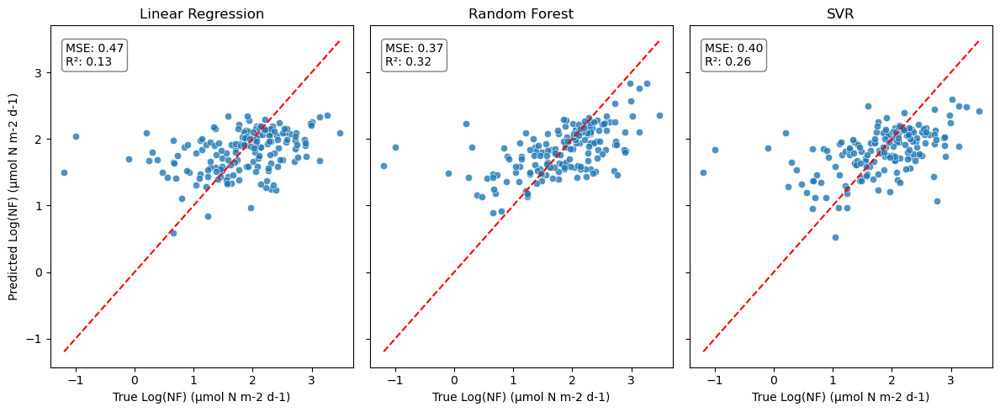

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

n_models = len(models)
fig, axes = plt.subplots(1, n_models, figsize=(4 * n_models, 5), sharey=True)

# 如果只有一个模型，axes 不是列表，要包成列表
if n_models == 1:
    axes = [axes]

results = []

for ax, (name, model) in zip(axes, models.items()):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({'Model': name, 'MSE': mse, 'R2': r2})

    # 散点图
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.8, ax=ax)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    ax.set_title(name)
    ax.set_xlabel("True Log(NF) (μmol N m-2 d-1)")
    if ax == axes[0]:
        ax.set_ylabel("Predicted Log(NF) (μmol N m-2 d-1)")
    else:
        ax.set_ylabel("")
    
    # MSE 和 R² 显示
    ax.text(
        0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}',
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray')
    )

plt.tight_layout()
plt.savefig("ML_model.png")
plt.show()



### Optimization (Grid Search, Random Search)

In [28]:
from sklearn.model_selection import GridSearchCV

In [29]:
# tuning SVR
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# para grid
param_grid = {
    'svr__C': [0.1, 1, 10, 100],
    'svr__epsilon': [0.1, 0.3, 0.5, 0.7],
    'svr__gamma': [0.001, 0.01, 0.1, 1]
}

# pipeline
svr_pipeline = make_pipeline(StandardScaler(), SVR(kernel='rbf'))

# grid search
grid_search = GridSearchCV(svr_pipeline,
                           param_grid,
                           cv=3,                      # 3-fold cv
                           scoring='r2',              # or 'neg_mean_squared_error'
                           n_jobs=-1,                 
                           verbose=2)

# fit
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation R²: ", grid_search.best_score_)


Fitting 3 folds for each of 64 candidates, totalling 192 fits
Best parameters found:  {'svr__C': 1, 'svr__epsilon': 0.3, 'svr__gamma': 0.1}
Best cross-validation R²:  0.14942306292945937


In [30]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

param_dist = {
    'svr__C': uniform(1, 100),
    'svr__epsilon': uniform(0.1, 1),
    'svr__gamma': uniform(0.001, 0.1)
}

rand_search = RandomizedSearchCV(svr_pipeline,
                                 param_distributions=param_dist,
                                 n_iter=50,
                                 cv=3,
                                 scoring='r2',
                                 random_state=42,
                                 n_jobs=-1,
                                 verbose=2)
rand_search.fit(X_train, y_train)
print("Best parameters found: ", rand_search.best_params_)
print("Best cross-validation R²: ", rand_search.best_score_)


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters found:  {'svr__C': 53.27328293819941, 'svr__epsilon': 0.5275410183585496, 'svr__gamma': 0.003541912674409519}
Best cross-validation R²:  0.1310263203067948


In [31]:
# random forest

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5],
    'max_features': ['sqrt', 'log2']
}

random_search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42),
    param_distributions=param_grid,
    n_iter=20,
    scoring='r2',
    cv=3,
    n_jobs=-1,
    random_state=42
)

random_search.fit(X_train, y_train)
best_model = random_search.best_estimator_
print(random_search.best_params_)


{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 10}


In [32]:
# linear regression

from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

param_grid = {'ridge__alpha': [0.01, 0.1, 1, 10, 100]}
model = make_pipeline(StandardScaler(), Ridge())
grid = GridSearchCV(model, param_grid, cv=5)
grid.fit(X_train, y_train)

print("Best alpha:", grid.best_params_)


Best alpha: {'ridge__alpha': 100}


### After Optimization

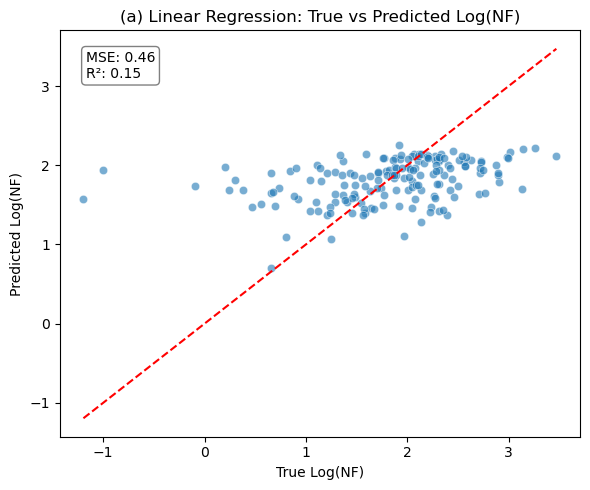

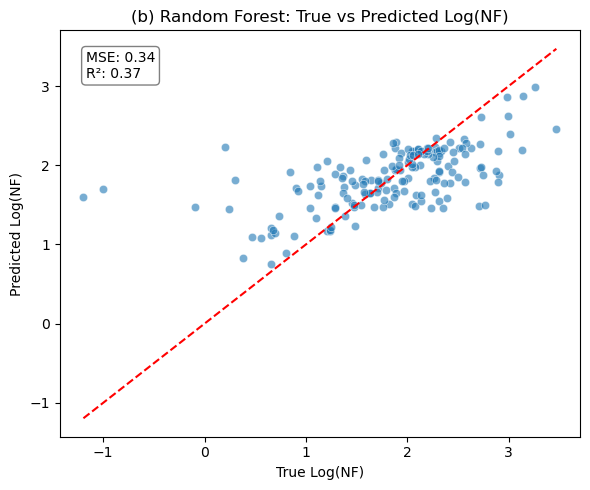

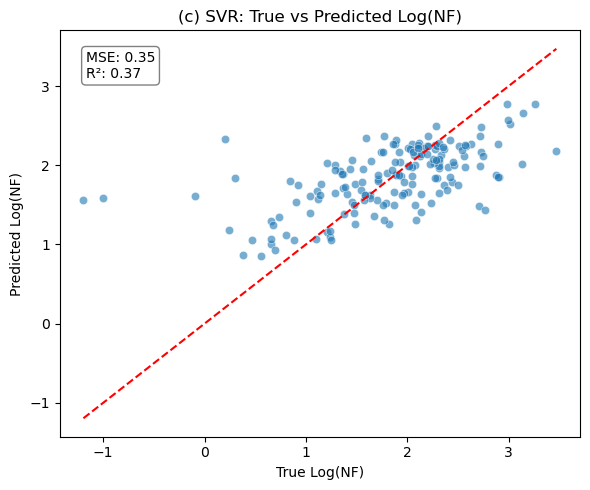

In [35]:
# models
models = {
    '(a) Linear Regression': make_pipeline(StandardScaler(), Ridge(alpha=100)),
    '(b) Random Forest': RandomForestRegressor(n_estimators=300, 
                                           min_samples_split=2, min_samples_leaf=1, 
                                           max_features= 'log2', max_depth=10,         
                                           random_state=42),
    '(c) SVR': make_pipeline(StandardScaler(), SVR(kernel='rbf',
                                               C=1, epsilon=0.3, gamma=0.1))
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({'Model': name, 'MSE': mse, 'R2': r2})
    
    # true vs predict + MSE, R²
    plt.figure(figsize=(6, 5))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("True Log(NF)")
    plt.ylabel("Predicted Log(NF)")
    plt.title(f'{name}: True vs Predicted Log(NF)')
    
    plt.text(
        0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}',
        transform=plt.gca().transAxes,
        fontsize=10, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray')
    )

    plt.tight_layout()
    plt.show()


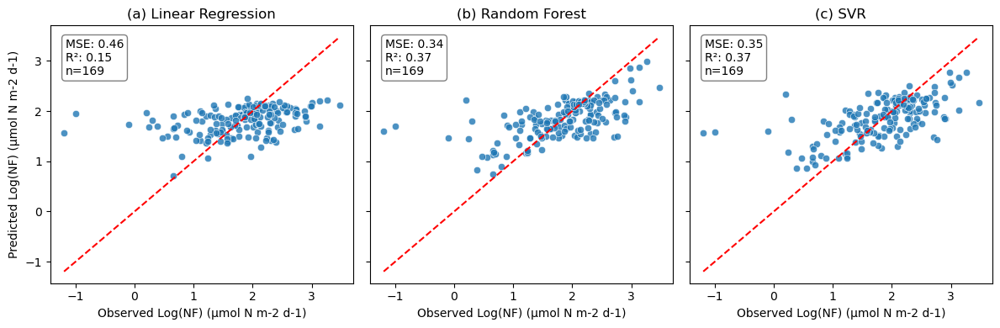

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

n_models = len(models)
fig, axes = plt.subplots(1, n_models, figsize=( 4 * n_models, 4), sharey=True)

results = []

for ax, (name, model) in zip(axes, models.items()):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({'Model': name, 'MSE': mse, 'R2': r2})

    # scatter plot
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.8, ax=ax)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    ax.set_title(name)
    ax.set_xlabel("Observed Log(NF) (μmol N m-2 d-1)")
    if ax == axes[0]:
        ax.set_ylabel("Predicted Log(NF) (μmol N m-2 d-1)")
    else:
        ax.set_ylabel("")
    
    # MSE, R² 
    ax.text(
        0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}\nn=169',
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray')
    )

plt.tight_layout()
plt.savefig("ML_model.png")
plt.show()


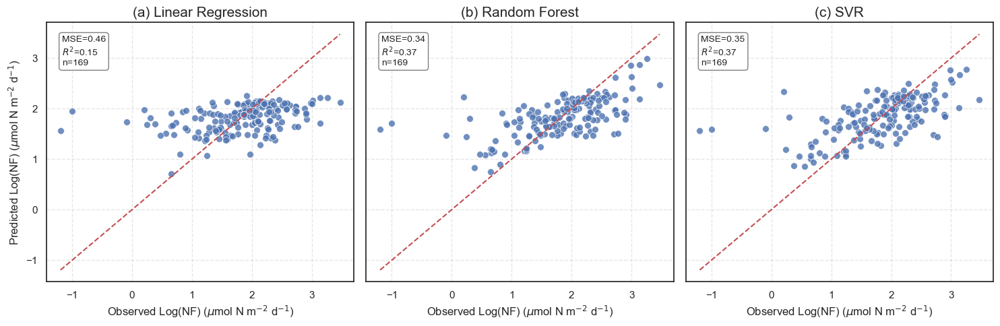

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# white background
sns.set(style='white', context='notebook')

fig, axes = plt.subplots(1, len(models), figsize=(5 * len(models), 5), sharey=True)
results = []

for ax, (name, model) in zip(axes, models.items()):
    # fit+ pred
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # mse + r2
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results.append({'Model': name, 'MSE': mse, 'R2': r2})

    # scatter plot
    sns.scatterplot(x=y_test, y=y_pred, ax=ax, alpha=0.8, s=50)

    # ideal fit
    ax.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        'r--'
    )

    # title
    ax.set_title(name, fontsize=15)
    ax.set_xlabel("Observed Log(NF) ($\mu$mol N m$^{-2}$ d$^{-1}$)", fontsize=12)
    if ax == axes[0]:
        ax.set_ylabel("Predicted Log(NF) ($\mu$mol N m$^{-2}$ d$^{-1}$)", fontsize=12)
    else:
        ax.set_ylabel("")

    # MSE + R²
    ax.text(
        0.05, 0.95,
        f'MSE={mse:.2f}\n$R^2$={r2:.2f}\nn={len(y_test)}',
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray')
    )

    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig("ML_model.png", dpi=300)
plt.show()


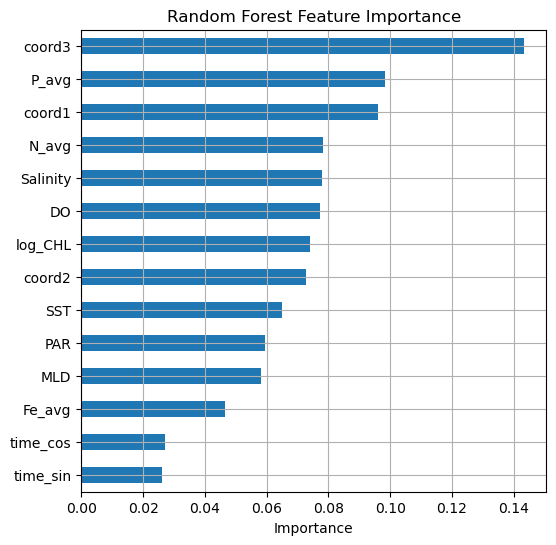

In [44]:
# importance
import pandas as pd
import numpy as np

rf = models['(b) Random Forest']
importances = rf.feature_importances_
feat_names = X_train.columns if hasattr(X_train, 'columns') else [f"X{i}" for i in range(len(importances))]

feat_importance = pd.Series(importances, index=feat_names)
feat_importance.sort_values().plot(kind='barh', figsize=(6, 6), title="Random Forest Feature Importance")
plt.xlabel("Importance")
plt.grid(True)
plt.show()


In [161]:
from joblib import dump

In [163]:
dump(models['(a) Linear Regression'], 'linear_model.pkl') 
dump(models['(b) Random Forest'], 'rf_model.pkl') 
dump(models['(c) SVR'], 'svr_model.pkl')

['svr_model.pkl']

### Global Map

In [54]:
import pandas as pd
import numpy as np
import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat

In [55]:
# mld
from scipy.io import loadmat
mld = loadmat('Argo_mixedlayers_monthlyclim_04142022.mat')
print(mld.keys())

dict_keys(['__header__', '__version__', '__globals__', 'latm', 'lonm', 'mld_da_max', 'mld_da_mean', 'mld_da_median', 'mld_da_std', 'mld_dt_max', 'mld_dt_mean', 'mld_dt_median', 'mld_dt_std', 'mld_ta_mean', 'mld_ta_median', 'mld_ta_std', 'mld_tt_mean', 'mld_tt_median', 'mld_tt_std', 'mlpd_da', 'mlpd_dt', 'mls_da', 'mls_dt', 'mlt_da', 'mlt_dt', 'num'])


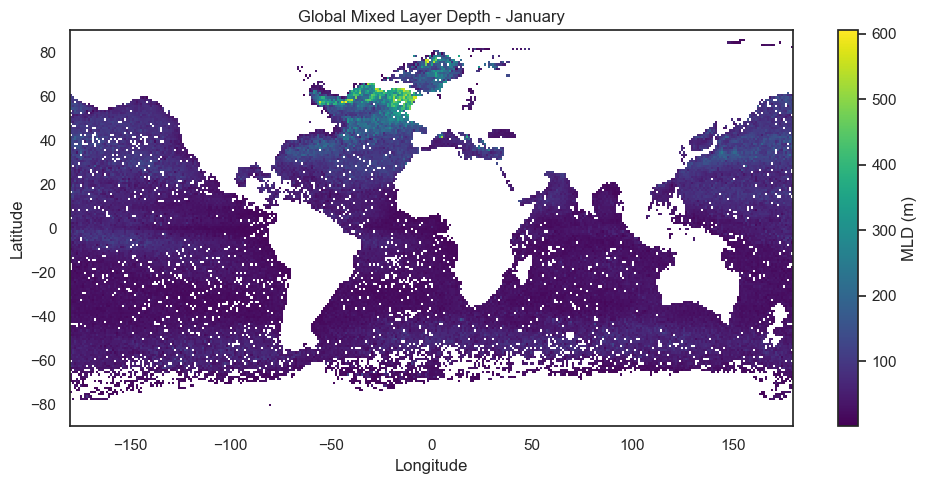

In [56]:
# 1月
import matplotlib.pyplot as plt
import numpy as np
lat = mld['latm'][0]   # shape (N_lat,)
lon = mld['lonm'][:,0] # shape (N_lon,)
ml_data = mld['mld_dt_mean'][0]  # 1 月数据，shape (N_lon, N_lat)

# need transpose，因为 meshgrid 默认是 [Y, X]
Lon, Lat = np.meshgrid(lon, lat)
MLD = ml_data.T  # shape (N_lat, N_lon)

plt.figure(figsize=(10, 5))
plt.pcolormesh(Lon, Lat, MLD, shading='auto', cmap='viridis')
plt.colorbar(label='MLD (m)')
plt.title("Global Mixed Layer Depth - January")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


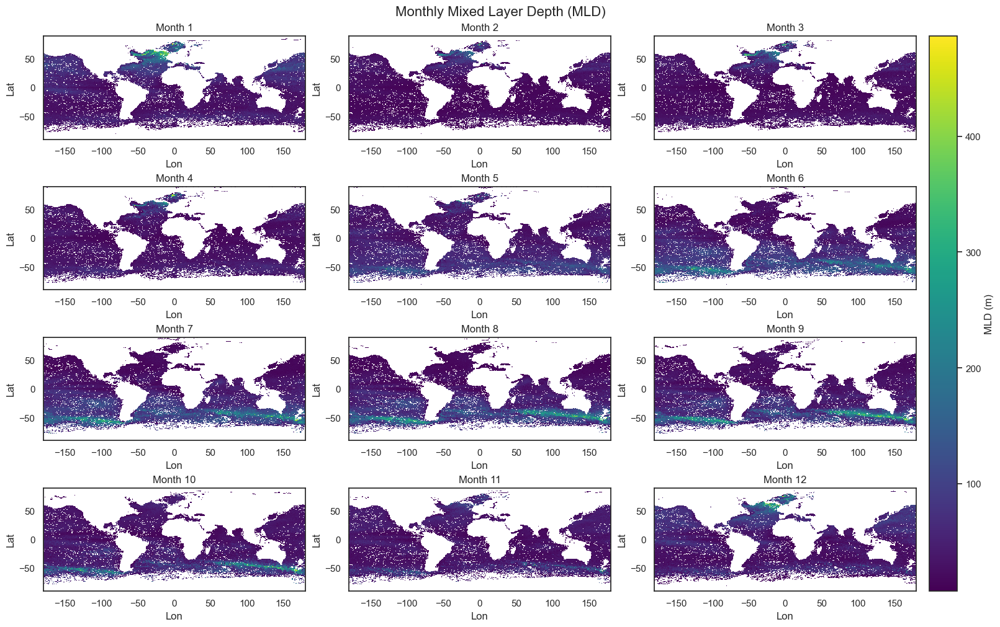

In [58]:
fig, axes = plt.subplots(4,3, figsize=(16, 10), constrained_layout=True)

for i in range(12):
    ax = axes.flat[i]
    mld_i = mld['mld_dt_mean'][i].T
    pcm = ax.pcolormesh(Lon, Lat, mld_i, shading='auto', cmap='viridis')
    ax.set_title(f'Month {i+1}')
    ax.set_xlabel('Lon')
    ax.set_ylabel('Lat')

fig.colorbar(pcm, ax=axes[:, -1], label='MLD (m)')
plt.suptitle("Monthly Mixed Layer Depth (MLD)", fontsize=16)
plt.show()


In [59]:
chl_data = loadmat('CHL/mean_chl_01.mat')

chl_data.keys()
# dict_keys(['__header__', '__version__', '__globals__', 'lat', 'lon', 'chl'])


dict_keys(['__header__', '__version__', '__globals__', 'LATITUDE', 'LONGITUDE', 'mean_CHL'])

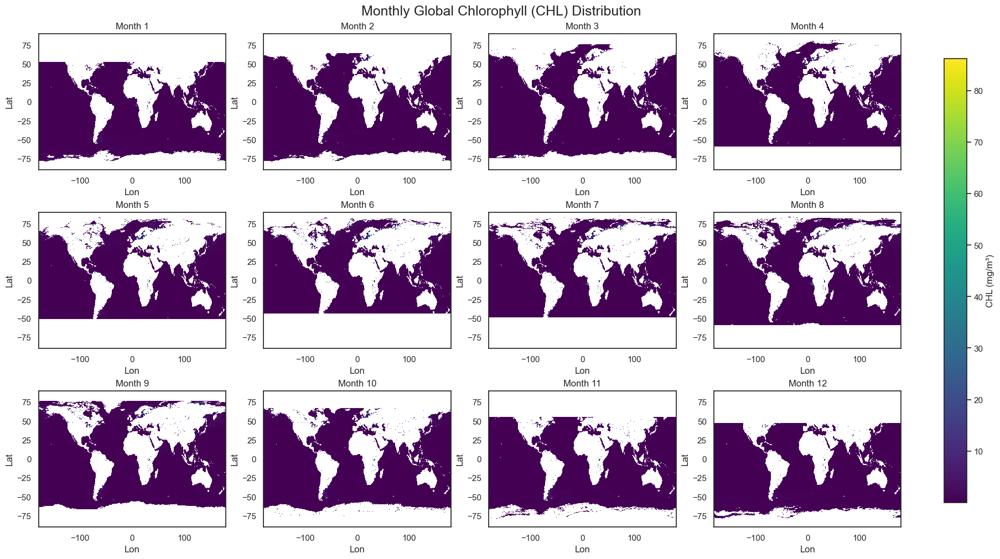

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import os

file_list = [f"CHL/mean_chl_{i:02d}.mat" for i in range(1, 13)]

fig, axes = plt.subplots(3, 4, figsize=(18, 10), constrained_layout=True)

# each month
for i, filename in enumerate(file_list):
    data = loadmat(filename)
    
    lat = data['LATITUDE'].squeeze()      # shape (N_lat,)
    lon = data['LONGITUDE'].squeeze()      # shape (N_lon,)
    chl = data['mean_CHL']                # shape assumed (N_lat, N_lon)

    # whether need transpose
    if chl.shape[0] == len(lon):  # 如果行数是经度，说明要转置
        chl = chl.T

    Lon, Lat = np.meshgrid(lon, lat)
    ax = axes.flat[i]
    im = ax.pcolormesh(Lon, Lat, chl, shading='auto', cmap='viridis')
    ax.set_title(f"Month {i+1}")
    ax.set_xlabel("Lon")
    ax.set_ylabel("Lat")

# colorbar
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.9)
cbar.set_label("CHL (mg/m³)")

plt.suptitle("Monthly Global Chlorophyll (CHL) Distribution", fontsize=18)
plt.show()


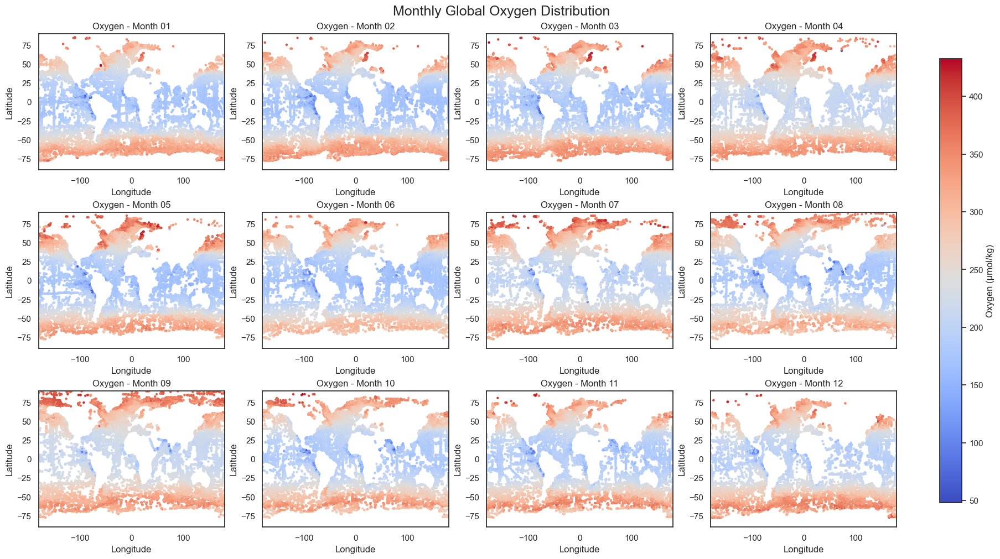

In [69]:
# Dissolved Oxygen

import pandas as pd
import matplotlib.pyplot as plt

# Plotting settings
fig, axes = plt.subplots(3, 4, figsize=(18, 10), constrained_layout=True)

for i in range(1, 13):
    month_str = f"{i:02d}"
    file_path = f"Oxygen/Oxygen{month_str}.csv"

    # Load CSV with header in second row
    df = pd.read_csv(file_path, skiprows=1).iloc[:, [0, 1, 2]]
    df.columns = ['LATITUDE', 'LONGITUDE', 'oxygen']

    # Extract lat/lon/data
    lat = df['LATITUDE']
    lon = df['LONGITUDE']
    oxygen = df['oxygen']

    # Plot
    ax = axes.flat[i - 1]
    sc = ax.scatter(lon, lat, c=oxygen, cmap='coolwarm', s=10, edgecolors='none')
    ax.set_title(f"Oxygen - Month {month_str}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)  
    ax.set_ylim(-90, 90)

# Shared colorbar
cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.9)
cbar.set_label("Oxygen (μmol/kg)")

plt.suptitle("Monthly Global Oxygen Distribution", fontsize=18)
plt.show()


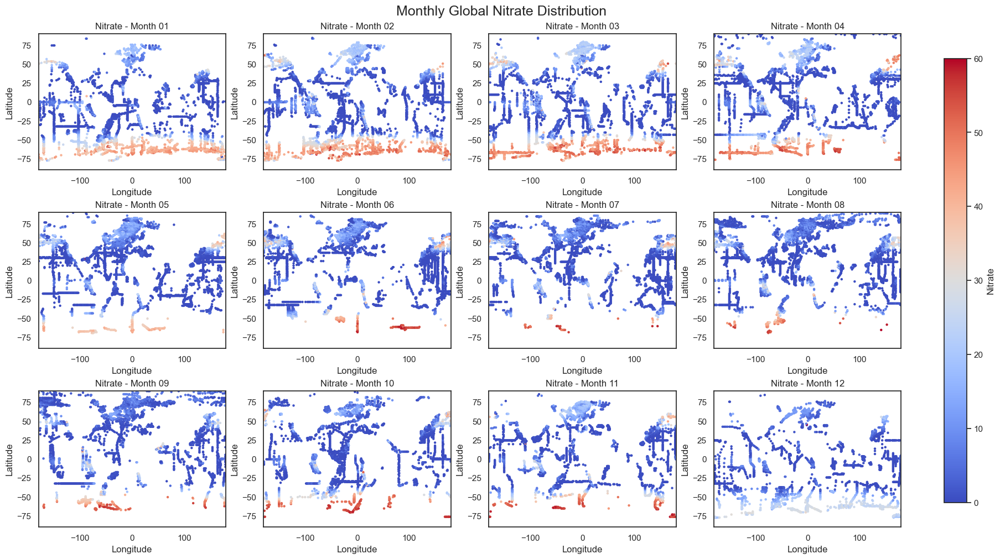

In [71]:
# Nitrate

import pandas as pd
import matplotlib.pyplot as plt

# Plotting settings
fig, axes = plt.subplots(3, 4, figsize=(18, 10), constrained_layout=True)

for i in range(1, 13):
    month_str = f"{i:02d}"
    file_path = f"Nitrate/Nitrate{month_str}.csv"

    # Load CSV with header in second row
    df = pd.read_csv(file_path, skiprows=1).iloc[:, [0, 1, 2]]
    df.columns = ['LATITUDE', 'LONGITUDE', 'N']

    # Extract lat/lon/data
    lat = df['LATITUDE']
    lon = df['LONGITUDE']
    oxygen = df['N']

    # Plot
    ax = axes.flat[i - 1]
    sc = ax.scatter(lon, lat, c=oxygen, cmap='coolwarm', s=10, edgecolors='none')
    ax.set_title(f"Nitrate - Month {month_str}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)  
    ax.set_ylim(-90, 90)

# Shared colorbar
cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.9)
cbar.set_label("Nitrate")

plt.suptitle("Monthly Global Nitrate Distribution", fontsize=18)
plt.show()


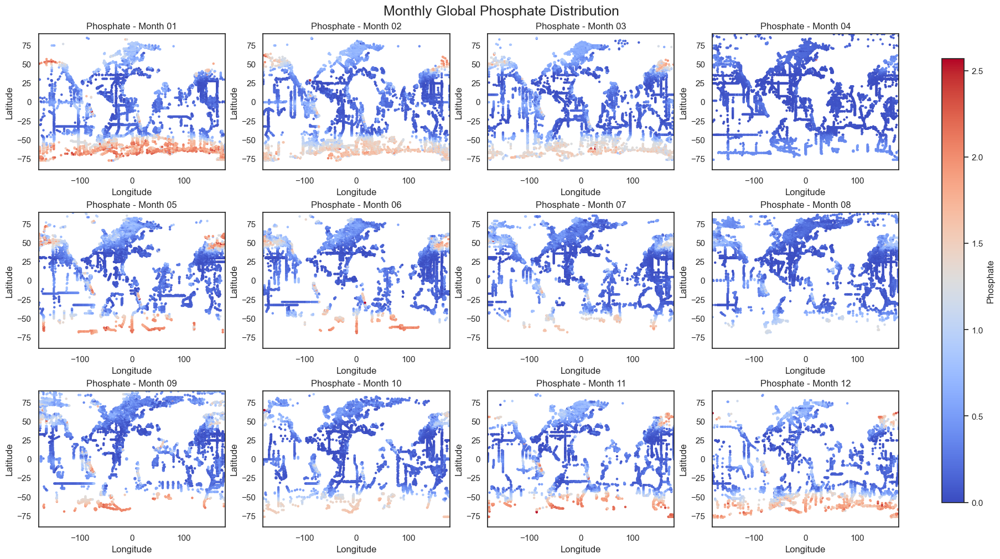

In [93]:
# Phosphate
fig, axes = plt.subplots(3, 4, figsize=(18, 10), constrained_layout=True)

for i in range(1, 13):
    month_str = f"{i:02d}"
    file_path = f"Phosphate/Phosphate{month_str}.csv"

    # Load CSV with header in second row
    df = pd.read_csv(file_path, skiprows=1).iloc[:, [0, 1, 2]]
    df.columns = ['LATITUDE', 'LONGITUDE', 'P']

    # Extract lat/lon/data
    lat = df['LATITUDE']
    lon = df['LONGITUDE']
    oxygen = df['P']

    # Plot
    ax = axes.flat[i - 1]
    sc = ax.scatter(lon, lat, c=oxygen, cmap='coolwarm', s=10, edgecolors='none')
    ax.set_title(f"Phosphate - Month {month_str}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)  
    ax.set_ylim(-90, 90)

# Shared colorbar
cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.9)
cbar.set_label("Phosphate")

plt.suptitle("Monthly Global Phosphate Distribution", fontsize=18)
plt.show()


### Kriging Interpolation

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pykrige.ok import OrdinaryKriging

In [82]:
df = pd.read_csv("Nitrate/Nitrate01.csv", skiprows=1).iloc[:, [0, 1, 2]]
df.columns = ['LATITUDE', 'LONGITUDE', 'N']


lon = df['LONGITUDE'].values
lat = df['LATITUDE'].values
val = df['N'].values


In [83]:
grid_lon = np.linspace(lon.min(), lon.max(), 200)
grid_lat = np.linspace(lat.min(), lat.max(), 100)
grid_lon_mesh, grid_lat_mesh = np.meshgrid(grid_lon, grid_lat)

In [85]:
print("lon shape:", lon.shape)
print("lat shape:", lat.shape)
print("val shape:", val.shape)
print("Any NaN:", np.any(np.isnan(lon)), np.any(np.isnan(lat)), np.any(np.isnan(val)))


lon shape: (3478,)
lat shape: (3478,)
val shape: (3478,)
Any NaN: False False True


In [86]:
import numpy as np

mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
lon_clean = lon[mask]
lat_clean = lat[mask]
val_clean = val[mask]


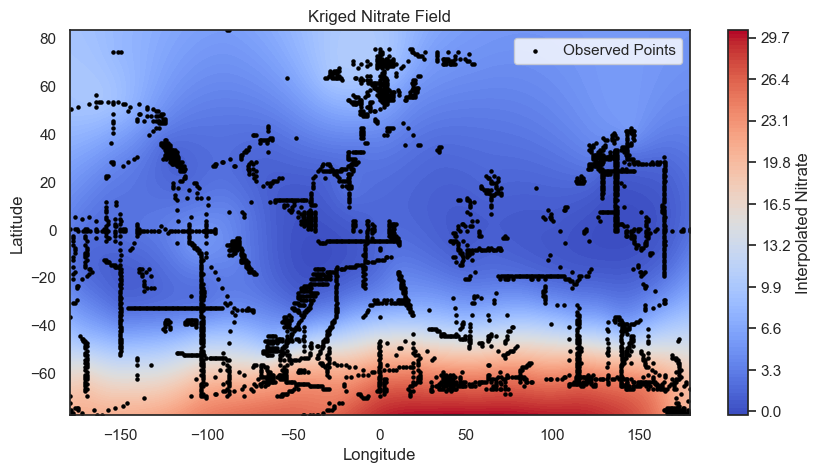

In [87]:
# 克里金插值模型
OK = OrdinaryKriging(
    lon_clean, lat_clean, val_clean,
    variogram_model='linear',  # 可选 gaussian, spherical, exponential
    verbose=False,
    enable_plotting=False
)

z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

# 可视化插值图
plt.figure(figsize=(10, 5))
plt.contourf(grid_lon, grid_lat, z_interp, cmap='coolwarm', levels=100)
plt.colorbar(label='Interpolated Nitrate')
plt.scatter(lon, lat, c='black', s=5, label='Observed Points')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kriged Nitrate Field")
plt.legend()
plt.show()

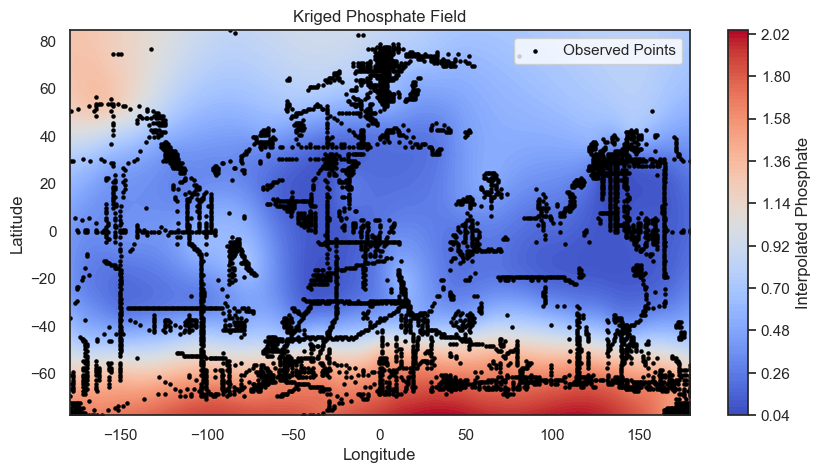

In [91]:
#---------- Phosphate ----------#

df = pd.read_csv("Phosphate/Phosphate01.csv", skiprows=1).iloc[:, [0, 1, 2]]
df.columns = ['LATITUDE', 'LONGITUDE', 'P']
lon = df['LONGITUDE'].values
lat = df['LATITUDE'].values
val = df['P'].values

grid_lon = np.linspace(lon.min(), lon.max(), 200)
grid_lat = np.linspace(lat.min(), lat.max(), 100)
grid_lon_mesh, grid_lat_mesh = np.meshgrid(grid_lon, grid_lat)

mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
lon_clean = lon[mask]
lat_clean = lat[mask]
val_clean = val[mask]

# Kriging
OK = OrdinaryKriging(
    lon_clean, lat_clean, val_clean,
    variogram_model='linear',  # 可选 gaussian, spherical, exponential
    verbose=False,
    enable_plotting=False
)

z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

plt.figure(figsize=(10, 5))
plt.contourf(grid_lon, grid_lat, z_interp, cmap='coolwarm', levels=100)
plt.colorbar(label='Interpolated Phosphate')
plt.scatter(lon, lat, c='black', s=5, label='Observed Points')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kriged Phosphate Field")
plt.legend()
plt.show()

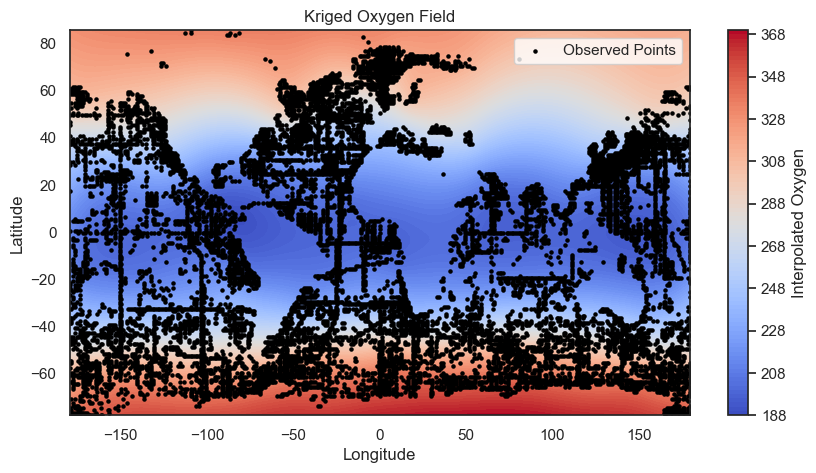

In [105]:
#---------- Oxygen ----------#

df = pd.read_csv("Oxygen/Oxygen01.csv", skiprows=1).iloc[:, [0, 1, 2]]
df.columns = ['LATITUDE', 'LONGITUDE', 'DO']
lon = df['LONGITUDE'].values
lat = df['LATITUDE'].values
val = df['DO'].values

grid_lon = np.linspace(lon.min(), lon.max(), 200)
grid_lat = np.linspace(lat.min(), lat.max(), 100)
grid_lon_mesh, grid_lat_mesh = np.meshgrid(grid_lon, grid_lat)

mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
lon_clean = lon[mask]
lat_clean = lat[mask]
val_clean = val[mask]

# Kriging
OK = OrdinaryKriging(
    lon_clean, lat_clean, val_clean,
    variogram_model='linear',  # 可选 gaussian, spherical, exponential
    verbose=False,
    enable_plotting=False
)

z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

plt.figure(figsize=(10, 5))
plt.contourf(grid_lon, grid_lat, z_interp, cmap='coolwarm', levels=100)
plt.colorbar(label='Interpolated Oxygen')
plt.scatter(lon, lat, c='black', s=5, label='Observed Points')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kriged Oxygen Field")
plt.legend()
plt.show()

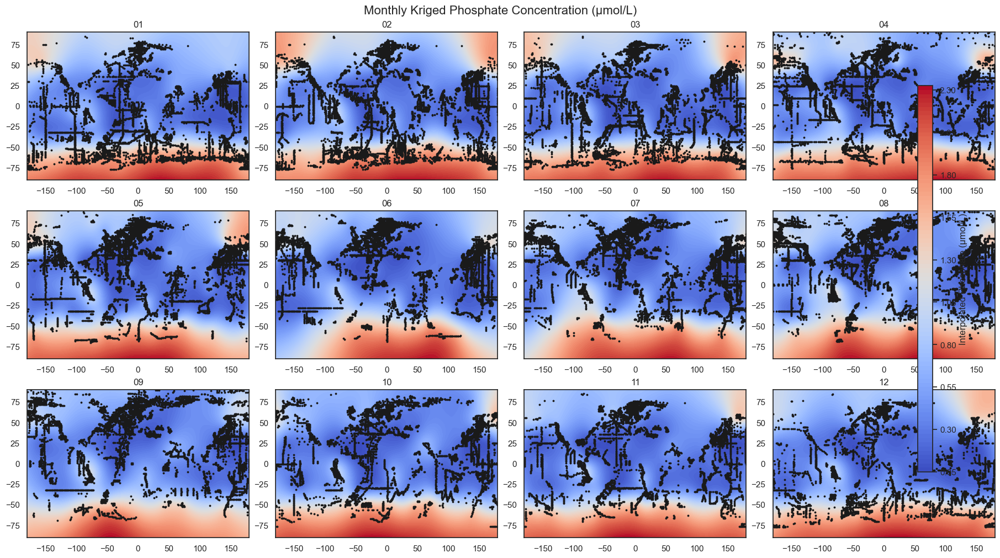

In [92]:
###-------- Visualization --------###

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pykrige.ok import OrdinaryKriging

fig, axes = plt.subplots(3, 4, figsize=(18,10), constrained_layout=True)

for i in range(12):
    month_str = f"{i+1:02d}"  # '01', '02', ..., '12'
    ax = axes[i // 4, i % 4]  # 子图位置

    try:
        df = pd.read_csv(f"Phosphate/Phosphate{month_str}.csv", skiprows=1).iloc[:, [0, 1, 2]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'P']
        lon = df['LONGITUDE'].values
        lat = df['LATITUDE'].values
        val = df['P'].values

        mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
        lon_clean = lon[mask]
        lat_clean = lat[mask]
        val_clean = val[mask]

        if len(val_clean) < 10:
            ax.set_title(f"{month_labels[i]}: Insufficient data")
            ax.axis('off')
            continue

        grid_lon = np.linspace(-180, 180, 200)
        grid_lat = np.linspace(-90, 90, 100)

        OK = OrdinaryKriging(
            lon_clean, lat_clean, val_clean,
            variogram_model='linear',
            verbose=False,
            enable_plotting=False
        )

        z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

        cf = ax.contourf(grid_lon, grid_lat, z_interp, cmap='coolwarm', levels=100)
        ax.scatter(lon_clean, lat_clean, c='k', s=3)
        ax.set_title(f"{month_str}")
        ax.set_xlim(-180, 180)
        ax.set_ylim(-90, 90)

    except Exception as e:
        ax.set_title(f"{month_str}: Error")
        ax.axis('off')
        print(f"Month {month_str}: {e}")

# colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(cf, cax=cbar_ax, label='Interpolated Phosphate (μmol/L)')

plt.suptitle("Monthly Kriged Phosphate Concentration (μmol/L)", fontsize=16)
plt.show()


### P

In [94]:
import numpy as np
import pandas as pd
from pykrige.ok import OrdinaryKriging
import os

# path
os.makedirs("Phosphate_gridded", exist_ok=True)

# 1° resolution
save_lon = np.linspace(-180, 180, 360)
save_lat = np.linspace(-90, 90, 180)

save_lon_mesh, save_lat_mesh = np.meshgrid(save_lon, save_lat)

for month in range(1, 13):
    month_str = f"{month:02d}"
    try:
        df = pd.read_csv(f"Phosphate/Phosphate{month_str}.csv", skiprows=1).iloc[:, [0, 1, 2]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'P']
    except Exception as e:
        print(f"Month {month_str}: Failed to read file - {e}")
        continue

    lon = df['LONGITUDE'].values
    lat = df['LATITUDE'].values
    val = df['P'].values

    mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
    lon_clean = lon[mask]
    lat_clean = lat[mask]
    val_clean = val[mask]

    if len(val_clean) < 10:
        print(f"Month {month_str}: insufficient data")
        continue

    # 克里金插值（粗网格）
    grid_lon = np.linspace(-180, 180, 200)
    grid_lat = np.linspace(-90, 90, 100)

    OK = OrdinaryKriging(
        lon_clean, lat_clean, val_clean,
        variogram_model='linear',
        verbose=False,
        enable_plotting=False
    )

    z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

    # 将插值结果插值到固定 (180, 360) 网格上
    from scipy.interpolate import RegularGridInterpolator

    interp_func = RegularGridInterpolator(
        (grid_lat, grid_lon), z_interp, bounds_error=False, fill_value=np.nan
    )
    z_uniform = interp_func(np.array([save_lat_mesh.ravel(), save_lon_mesh.ravel()]).T)
    z_uniform = z_uniform.reshape(save_lat_mesh.shape)  # (180, 360)

    # 保存为 .npz 文件
    np.savez(f"Phosphate_gridded/phosphate_{month_str}.npz",
             phosphate=z_uniform,
             lon=save_lon,
             lat=save_lat)
    
    print(f"Month {month_str}: saved successfully with shape {z_uniform.shape}")


Month 01: saved successfully with shape (180, 360)
Month 02: saved successfully with shape (180, 360)
Month 03: saved successfully with shape (180, 360)
Month 04: saved successfully with shape (180, 360)
Month 05: saved successfully with shape (180, 360)
Month 06: saved successfully with shape (180, 360)
Month 07: saved successfully with shape (180, 360)
Month 08: saved successfully with shape (180, 360)
Month 09: saved successfully with shape (180, 360)
Month 10: saved successfully with shape (180, 360)
Month 11: saved successfully with shape (180, 360)
Month 12: saved successfully with shape (180, 360)


### Nitrate

In [95]:
import numpy as np
import pandas as pd
from pykrige.ok import OrdinaryKriging
import os

# path
os.makedirs("Nitrate_gridded", exist_ok=True)

# 1° resolution
save_lon = np.linspace(-180, 180, 360)
save_lat = np.linspace(-90, 90, 180)

save_lon_mesh, save_lat_mesh = np.meshgrid(save_lon, save_lat)

for month in range(1, 13):
    month_str = f"{month:02d}"
    try:
        df = pd.read_csv(f"Nitrate/Nitrate{month_str}.csv", skiprows=1).iloc[:, [0, 1, 2]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'N']
    except Exception as e:
        print(f"Month {month_str}: Failed to read file - {e}")
        continue

    lon = df['LONGITUDE'].values
    lat = df['LATITUDE'].values
    val = df['N'].values

    mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
    lon_clean = lon[mask]
    lat_clean = lat[mask]
    val_clean = val[mask]

    if len(val_clean) < 10:
        print(f"Month {month_str}: insufficient data")
        continue

    # 克里金插值（粗网格）
    grid_lon = np.linspace(-180, 180, 200)
    grid_lat = np.linspace(-90, 90, 100)

    OK = OrdinaryKriging(
        lon_clean, lat_clean, val_clean,
        variogram_model='linear',
        verbose=False,
        enable_plotting=False
    )

    z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

    # 将插值结果插值到固定 (180, 360) 网格上
    from scipy.interpolate import RegularGridInterpolator

    interp_func = RegularGridInterpolator(
        (grid_lat, grid_lon), z_interp, bounds_error=False, fill_value=np.nan
    )
    z_uniform = interp_func(np.array([save_lat_mesh.ravel(), save_lon_mesh.ravel()]).T)
    z_uniform = z_uniform.reshape(save_lat_mesh.shape)  # (180, 360)

    # 保存为 .npz 文件
    np.savez(f"Nitrate_gridded/Nitrate_{month_str}.npz",
             nitrate=z_uniform,
             lon=save_lon,
             lat=save_lat)
    
    print(f"Nitrate Month {month_str}: saved successfully with shape {z_uniform.shape}")


Nitrate Month 01: saved successfully with shape (180, 360)
Nitrate Month 02: saved successfully with shape (180, 360)
Nitrate Month 03: saved successfully with shape (180, 360)
Nitrate Month 04: saved successfully with shape (180, 360)
Nitrate Month 05: saved successfully with shape (180, 360)
Nitrate Month 06: saved successfully with shape (180, 360)
Nitrate Month 07: saved successfully with shape (180, 360)
Nitrate Month 08: saved successfully with shape (180, 360)
Nitrate Month 09: saved successfully with shape (180, 360)
Nitrate Month 10: saved successfully with shape (180, 360)
Nitrate Month 11: saved successfully with shape (180, 360)
Nitrate Month 12: saved successfully with shape (180, 360)


### Dissolved Oxygen

In [174]:
import numpy as np
import pandas as pd
from pykrige.ok import OrdinaryKriging
import os

# path
os.makedirs("DO_gridded", exist_ok=True)

# 1° resolution
save_lon = np.linspace(-180, 180, 360)
save_lat = np.linspace(-90, 90, 180)

save_lon_mesh, save_lat_mesh = np.meshgrid(save_lon, save_lat)

for month in range(1, 13):
    month_str = f"{month:02d}"
    try:
        df = pd.read_csv(f"Oxygen/Oxygen{month_str}.csv", skiprows=1).iloc[:, [0, 1, 2]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'DO']
    except Exception as e:
        print(f"Month {month_str}: Failed to read file - {e}")
        continue

    lon = df['LONGITUDE'].values
    lat = df['LATITUDE'].values
    val = df['DO'].values

    mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
    lon_clean = lon[mask]
    lat_clean = lat[mask]
    val_clean = val[mask]

    if len(val_clean) < 10:
        print(f"Month {month_str}: insufficient data")
        continue

    # 克里金插值（粗网格）
    grid_lon = np.linspace(-180, 180, 200)
    grid_lat = np.linspace(-90, 90, 100)

    OK = OrdinaryKriging(
        lon_clean, lat_clean, val_clean,
        variogram_model='linear',
        verbose=False,
        enable_plotting=False
    )

    z_interp, ss = OK.execute('grid', grid_lon, grid_lat)

    # 将插值结果插值到固定 (180, 360) 网格上
    from scipy.interpolate import RegularGridInterpolator

    interp_func = RegularGridInterpolator(
        (grid_lat, grid_lon), z_interp, bounds_error=False, fill_value=np.nan
    )
    z_uniform = interp_func(np.array([save_lat_mesh.ravel(), save_lon_mesh.ravel()]).T)
    z_uniform = z_uniform.reshape(save_lat_mesh.shape)  # (180, 360)

    # 保存为 .npz 文件
    np.savez(f"DO_gridded/DO_{month_str}.npz",
             DO=z_uniform,
             lon=save_lon,
             lat=save_lat)
    
    print(f"DO Month {month_str}: saved successfully with shape {z_uniform.shape}")


DO Month 01: saved successfully with shape (180, 360)
DO Month 02: saved successfully with shape (180, 360)
DO Month 03: saved successfully with shape (180, 360)
DO Month 04: saved successfully with shape (180, 360)
DO Month 05: saved successfully with shape (180, 360)
DO Month 06: saved successfully with shape (180, 360)
DO Month 07: saved successfully with shape (180, 360)
DO Month 08: saved successfully with shape (180, 360)
DO Month 09: saved successfully with shape (180, 360)
DO Month 10: saved successfully with shape (180, 360)
DO Month 11: saved successfully with shape (180, 360)
DO Month 12: saved successfully with shape (180, 360)


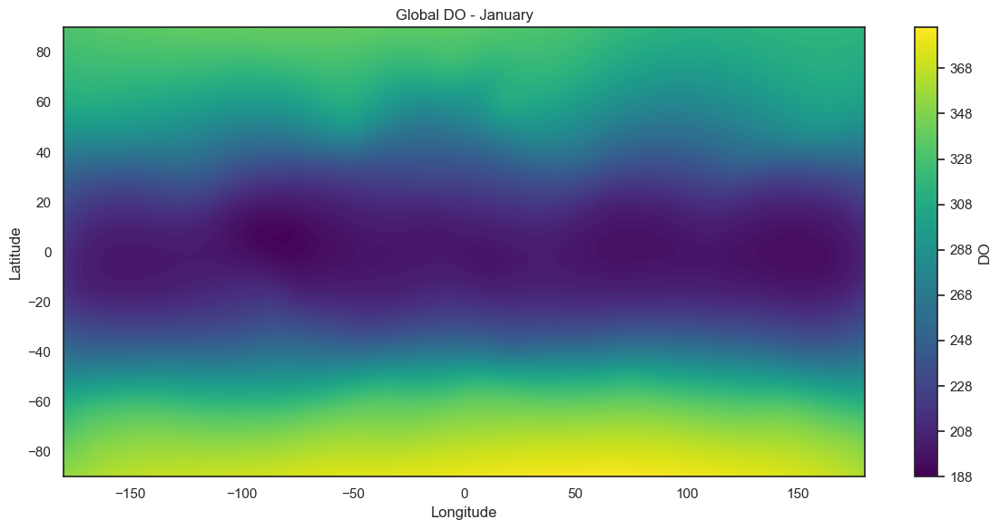

In [175]:
data = np.load("DO_gridded/DO_01.npz")
z = data['DO']
lon = data['lon']
lat = data['lat']

lon_mesh, lat_mesh = np.meshgrid(lon, lat)

plt.figure(figsize=(12, 6))
c = plt.contourf(lon_mesh, lat_mesh, z, levels=100, cmap='viridis')
plt.colorbar(c, label='DO')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Global DO - January')
plt.grid(True)
plt.tight_layout()
plt.show()


### MLD

In [96]:
import numpy as np
from scipy.io import loadmat
from scipy.spatial import cKDTree

In [155]:
# mld data
mld = loadmat('Argo_mixedlayers_monthlyclim_04142022.mat')
lat = mld['latm'][0]    # (N_lat,)
lon = mld['lonm'][:, 0] # (N_lon,)

# target grid
target_lat = np.linspace(-89.5, 89.5, 180)
target_lon = np.linspace(-179.5, 179.5, 360)
target_lon_mesh, target_lat_mesh = np.meshgrid(target_lon, target_lat)  # shape (180, 360)

# 建立原始点坐标和KD树（用于匹配）
orig_Lon, orig_Lat = np.meshgrid(lon, lat)  # (N_lat, N_lon)
orig_points = np.vstack([orig_Lat.ravel(), orig_Lon.ravel()]).T
tree = cKDTree(orig_points)

# 目标网格点坐标
target_points = np.vstack([target_lat_mesh.ravel(), target_lon_mesh.ravel()]).T

# 找到最近的原始点
_, idx = tree.query(target_points)
idx_lat, idx_lon = np.unravel_index(idx, orig_Lat.shape)

for month in range(12):
    # shape (N_lon, N_lat)
    ml_data = mld['mld_dt_mean'][month]
    ml_data_T = ml_data.T  # shape (N_lat, N_lon)

    # 映射到统一网格
    mapped_data = ml_data_T[idx_lat, idx_lon].reshape(180, 360)

    np.savez(f"MLD_{month+1:02d}.npz", MLD=mapped_data, lat=target_lat, lon=target_lon)
    print(f"Saved: MLD_{month+1:02d}.npz, shape: {mapped_data.shape}")

Saved: MLD_01.npz, shape: (180, 360)
Saved: MLD_02.npz, shape: (180, 360)
Saved: MLD_03.npz, shape: (180, 360)
Saved: MLD_04.npz, shape: (180, 360)
Saved: MLD_05.npz, shape: (180, 360)
Saved: MLD_06.npz, shape: (180, 360)
Saved: MLD_07.npz, shape: (180, 360)
Saved: MLD_08.npz, shape: (180, 360)
Saved: MLD_09.npz, shape: (180, 360)
Saved: MLD_10.npz, shape: (180, 360)
Saved: MLD_11.npz, shape: (180, 360)
Saved: MLD_12.npz, shape: (180, 360)


### CHL, PAR, SST

In [158]:

import numpy as np
from scipy.io import loadmat
from scipy.spatial import cKDTree
import os

from scipy.io import loadmat
from scipy.spatial import cKDTree
import numpy as np

file_list = [f"CHL/mean_chl_{i:02d}.mat" for i in range(1, 13)]

# 目标网格
target_lat = np.linspace(-89.5, 89.5, 180)
target_lon = np.linspace(-179.5, 179.5, 360)
target_lon_mesh, target_lat_mesh = np.meshgrid(target_lon, target_lat)
target_points = np.vstack([target_lat_mesh.ravel(), target_lon_mesh.ravel()]).T

for i, filename in enumerate(file_list):
    data = loadmat(filename)

    lat = data['LATITUDE'].squeeze()  # (N_lat,)
    lon = data['LONGITUDE'].squeeze()  # (N_lon,)
    chl = data['mean_CHL']  # shape: (N_lat, N_lon) or (N_lon, N_lat)

    # 如果经度在行，转置成标准的 (lat, lon)
    if chl.shape[0] == len(lon):
        chl = chl.T

    # 原始经纬网格
    Lon, Lat = np.meshgrid(lon, lat)  # shape (N_lat, N_lon)
    points = np.vstack([Lat.ravel(), Lon.ravel()]).T

    # 构建 KDTree
    tree = cKDTree(points)

    # 查找最近点并映射
    _, idx = tree.query(target_points)
    idx_lat, idx_lon = np.unravel_index(idx, Lat.shape)
    mapped_chl = chl[idx_lat, idx_lon].reshape(180, 360)

    # 存储为 .npz 文件
    np.savez(f"CHL_{i+1:02d}.npz", CHL=mapped_chl, lat=target_lat, lon=target_lon)
    print(f"Saved CHL_{i+1:02d}.npz, shape: {mapped_chl.shape}")


Saved CHL_01.npz, shape: (180, 360)
Saved CHL_02.npz, shape: (180, 360)
Saved CHL_03.npz, shape: (180, 360)
Saved CHL_04.npz, shape: (180, 360)
Saved CHL_05.npz, shape: (180, 360)
Saved CHL_06.npz, shape: (180, 360)
Saved CHL_07.npz, shape: (180, 360)
Saved CHL_08.npz, shape: (180, 360)
Saved CHL_09.npz, shape: (180, 360)
Saved CHL_10.npz, shape: (180, 360)
Saved CHL_11.npz, shape: (180, 360)
Saved CHL_12.npz, shape: (180, 360)


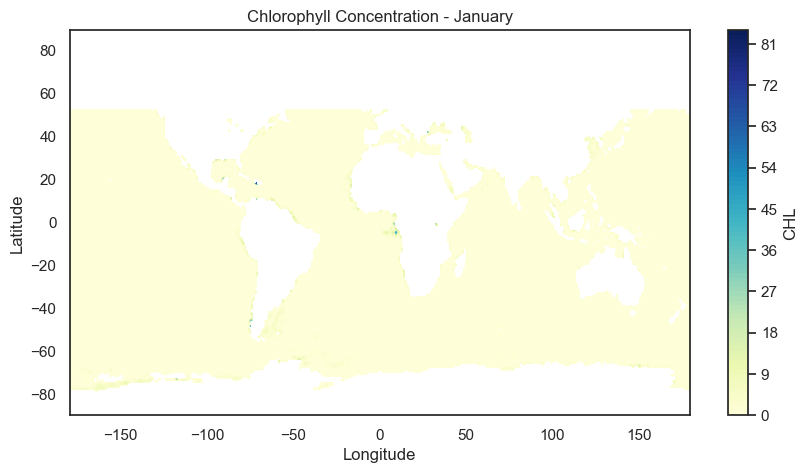

In [148]:
import numpy as np
import matplotlib.pyplot as plt

data = np.load("CHL_month01.npz")
chl = data["CHL"]
lat = data["lat"]
lon = data["lon"]

plt.figure(figsize=(10, 5))
plt.contourf(lon, lat, chl, levels=100, cmap="YlGnBu")
plt.colorbar(label="CHL")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Chlorophyll Concentration - January")
plt.show()


In [159]:
file_list = [f"PAR/mean_par_{i:02d}.mat" for i in range(1, 13)]

# target grid
target_lat = np.linspace(-89.5, 89.5, 180)
target_lon = np.linspace(-179.5, 179.5, 360)
target_lon_mesh, target_lat_mesh = np.meshgrid(target_lon, target_lat)
target_points = np.vstack([target_lat_mesh.ravel(), target_lon_mesh.ravel()]).T

for i, filename in enumerate(file_list):
    data = loadmat(filename)

    lat = data['LATITUDE'].squeeze()  # (N_lat,)
    lon = data['LONGITUDE'].squeeze()  # (N_lon,)
    par = data['mean_CHL']  # shape: (N_lat, N_lon) or (N_lon, N_lat) PAR当时存错了

    # 如果经度在行，转置成标准的 (lat, lon)
    if par.shape[0] == len(lon):
        par = par.T

    # 原始经纬网格
    Lon, Lat = np.meshgrid(lon, lat)  # shape (N_lat, N_lon)
    points = np.vstack([Lat.ravel(), Lon.ravel()]).T

    # 构建 KDTree
    tree = cKDTree(points)

    # 查找最近点并映射
    _, idx = tree.query(target_points)
    idx_lat, idx_lon = np.unravel_index(idx, Lat.shape)
    mapped_par = par[idx_lat, idx_lon].reshape(180, 360)

    # save as .npz
    np.savez(f"PAR_{i+1:02d}.npz", PAR=mapped_par, lat=target_lat, lon=target_lon)
    print(f"Saved PAR_{i+1:02d}.npz, shape: {mapped_par.shape}")


Saved PAR_01.npz, shape: (180, 360)
Saved PAR_02.npz, shape: (180, 360)
Saved PAR_03.npz, shape: (180, 360)
Saved PAR_04.npz, shape: (180, 360)
Saved PAR_05.npz, shape: (180, 360)
Saved PAR_06.npz, shape: (180, 360)
Saved PAR_07.npz, shape: (180, 360)
Saved PAR_08.npz, shape: (180, 360)
Saved PAR_09.npz, shape: (180, 360)
Saved PAR_10.npz, shape: (180, 360)
Saved PAR_11.npz, shape: (180, 360)
Saved PAR_12.npz, shape: (180, 360)


In [160]:
file_list = [f"SST/mean_sst_{i:02d}.mat" for i in range(1, 13)]

# 目标网格
target_lat = np.linspace(-89.5, 89.5, 180)
target_lon = np.linspace(-179.5, 179.5, 360)
target_lon_mesh, target_lat_mesh = np.meshgrid(target_lon, target_lat)
target_points = np.vstack([target_lat_mesh.ravel(), target_lon_mesh.ravel()]).T

for i, filename in enumerate(file_list):
    data = loadmat(filename)

    lat = data['LATITUDE'].squeeze()  # (N_lat,)
    lon = data['LONGITUDE'].squeeze()  # (N_lon,)
    sst = data['mean_SST']  # shape: (N_lat, N_lon) or (N_lon, N_lat)

    # 如果经度在行，转置成标准的 (lat, lon)
    if sst.shape[0] == len(lon):
        sst = sst.T

    # 原始经纬网格
    Lon, Lat = np.meshgrid(lon, lat)  # shape (N_lat, N_lon)
    points = np.vstack([Lat.ravel(), Lon.ravel()]).T

    # 构建 KDTree
    tree = cKDTree(points)

    # 查找最近点并映射
    _, idx = tree.query(target_points)
    idx_lat, idx_lon = np.unravel_index(idx, Lat.shape)
    mapped_sst = sst[idx_lat, idx_lon].reshape(180, 360)

    # save as .npz
    np.savez(f"SST_{i+1:02d}.npz", SST=mapped_sst, lat=target_lat, lon=target_lon)
    print(f"Saved SST_{i+1:02d}.npz, shape: {mapped_sst.shape}")


Saved SST_01.npz, shape: (180, 360)
Saved SST_02.npz, shape: (180, 360)
Saved SST_03.npz, shape: (180, 360)
Saved SST_04.npz, shape: (180, 360)
Saved SST_05.npz, shape: (180, 360)
Saved SST_06.npz, shape: (180, 360)
Saved SST_07.npz, shape: (180, 360)
Saved SST_08.npz, shape: (180, 360)
Saved SST_09.npz, shape: (180, 360)
Saved SST_10.npz, shape: (180, 360)
Saved SST_11.npz, shape: (180, 360)
Saved SST_12.npz, shape: (180, 360)


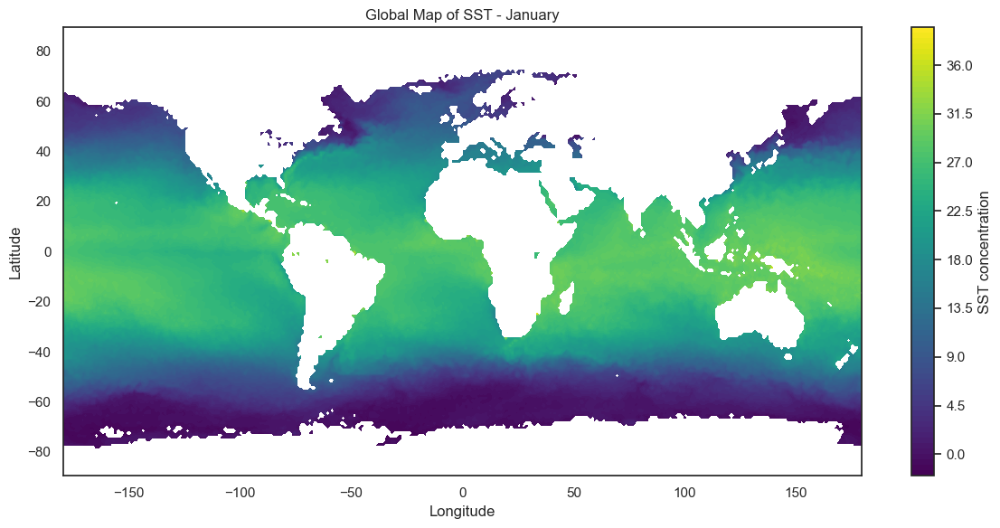

In [151]:
import numpy as np
import matplotlib.pyplot as plt

data = np.load("SST_gridded/SST_month01.npz")
sst = data['SST']
lon = data['lon']
lat = data['lat']

lon_mesh, lat_mesh = np.meshgrid(lon, lat)
plt.figure(figsize=(12, 6))
plt.contourf(lon_mesh, lat_mesh, sst, cmap='viridis', levels=100)
plt.colorbar(label='SST concentration')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Global Map of SST - January')
plt.tight_layout()
plt.show()

### Fe

In [168]:
import numpy as np
import pandas as pd
from scipy.interpolate import griddata
import os

os.makedirs("Fe_gridded", exist_ok=True)

#  1° 
save_lon = np.linspace(-180, 180, 360)
save_lat = np.linspace(-90, 90, 180)
save_lon_mesh, save_lat_mesh = np.meshgrid(save_lon, save_lat)

for month in range(1, 13):
    month_str = f"{month:02d}"
    try:
        df = pd.read_csv(f"dFe_RF/dFe_RF_data_month_{month}.csv").iloc[:, [1, 2, 3]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'Fe']
    except Exception as e:
        print(f"Month {month_str}: Failed to read file - {e}")
        continue

    lon = df['LONGITUDE'].values
    lat = df['LATITUDE'].values
    val = df['Fe'].values

    mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
    lon_clean = lon[mask]
    lat_clean = lat[mask]
    val_clean = val[mask]

    if len(val_clean) < 10:
        print(f"Month {month_str}: insufficient data")
        continue

    # 插值到统一网格
    points = np.column_stack((lon_clean, lat_clean))
    z_uniform = griddata(
        points, val_clean,
        (save_lon_mesh, save_lat_mesh),
        method='linear'  # 可选 'linear', 'nearest', 'cubic'
    )

    # save as .npz file
    np.savez(f"Fe_gridded/Fe_{month_str}.npz",
             Fe=z_uniform,
             lon=save_lon,
             lat=save_lat)

    print(f"Fe Month {month_str}: saved successfully with shape {z_uniform.shape}")


Fe Month 01: saved successfully with shape (180, 360)
Fe Month 02: saved successfully with shape (180, 360)
Fe Month 03: saved successfully with shape (180, 360)
Fe Month 04: saved successfully with shape (180, 360)
Fe Month 05: saved successfully with shape (180, 360)
Fe Month 06: saved successfully with shape (180, 360)
Fe Month 07: saved successfully with shape (180, 360)
Fe Month 08: saved successfully with shape (180, 360)
Fe Month 09: saved successfully with shape (180, 360)
Fe Month 10: saved successfully with shape (180, 360)
Fe Month 11: saved successfully with shape (180, 360)
Fe Month 12: saved successfully with shape (180, 360)


### Salinity

In [171]:
os.makedirs("Salinity_gridded", exist_ok=True)

#  1° 
save_lon = np.linspace(-180, 180, 360)
save_lat = np.linspace(-90, 90, 180)
save_lon_mesh, save_lat_mesh = np.meshgrid(save_lon, save_lat)

for month in range(1, 13):
    month_str = f"{month:02d}"
    try:
        df = pd.read_csv(f"salinity/woa23_decav_s{month_str}mn01.csv",skiprows=1).iloc[:, [0, 1, 2]]
        df.columns = ['LATITUDE', 'LONGITUDE', 'salinity']
        
    except Exception as e:
        print(f"Month {month_str}: Failed to read file - {e}")
        continue

    lon = df['LONGITUDE'].values
    lat = df['LATITUDE'].values
    val = df['salinity'].values

    mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(val)
    lon_clean = lon[mask]
    lat_clean = lat[mask]
    val_clean = val[mask]

    if len(val_clean) < 10:
        print(f"Month {month_str}: insufficient data")
        continue

    # 插值到统一网格
    points = np.column_stack((lon_clean, lat_clean))
    z_uniform = griddata(
        points, val_clean,
        (save_lon_mesh, save_lat_mesh),
        method='linear'  # 可选 'linear', 'nearest', 'cubic'
    )

    # save as .npz file
    np.savez(f"Salinity_gridded/Salinity_{month_str}.npz",
             Salinity=z_uniform,
             lon=save_lon,
             lat=save_lat)

    print(f"Salinity Month {month_str}: saved successfully with shape {z_uniform.shape}")


Salinity Month 01: saved successfully with shape (180, 360)
Salinity Month 02: saved successfully with shape (180, 360)
Salinity Month 03: saved successfully with shape (180, 360)
Salinity Month 04: saved successfully with shape (180, 360)
Salinity Month 05: saved successfully with shape (180, 360)
Salinity Month 06: saved successfully with shape (180, 360)
Salinity Month 07: saved successfully with shape (180, 360)
Salinity Month 08: saved successfully with shape (180, 360)
Salinity Month 09: saved successfully with shape (180, 360)
Salinity Month 10: saved successfully with shape (180, 360)
Salinity Month 11: saved successfully with shape (180, 360)
Salinity Month 12: saved successfully with shape (180, 360)


### Map Plot

In [176]:
import numpy as np
import matplotlib.pyplot as plt
import joblib  # 或pickle加载模型
import os

# === 1. 加载模型（linear_reg, rf_model, svm_model）===
linear_reg = joblib.load('linear_model.pkl')
rf_model = joblib.load('rf_model.pkl')
svr_model = joblib.load('svr_model.pkl')

PAR_gridded/PAR_01.npz
SST_gridded/SST_01.npz
CHL_gridded/CHL_01.npz
MLD_gridded/MLD_01.npz
Salinity_gridded/Salinity_01.npz
DO_gridded/DO_01.npz
nitrate_gridded/nitrate_01.npz
phosphate_gridded/phosphate_01.npz
Fe_gridded/Fe_01.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


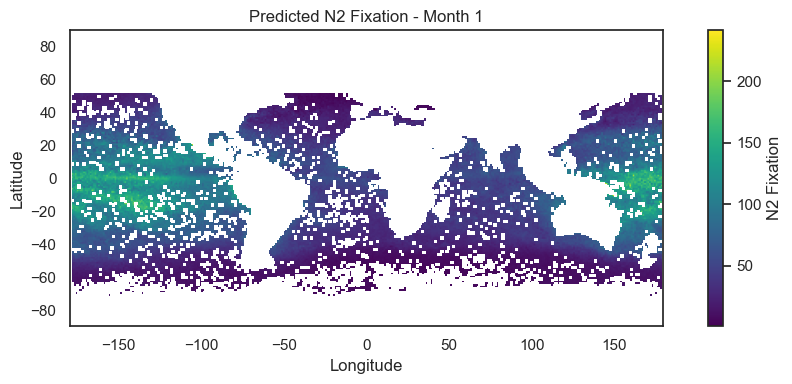

PAR_gridded/PAR_02.npz
SST_gridded/SST_02.npz
CHL_gridded/CHL_02.npz
MLD_gridded/MLD_02.npz
Salinity_gridded/Salinity_02.npz
DO_gridded/DO_02.npz
nitrate_gridded/nitrate_02.npz
phosphate_gridded/phosphate_02.npz
Fe_gridded/Fe_02.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


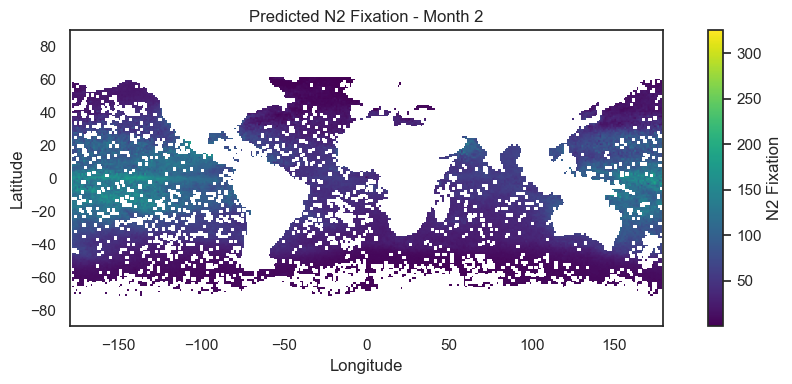

PAR_gridded/PAR_03.npz
SST_gridded/SST_03.npz
CHL_gridded/CHL_03.npz
MLD_gridded/MLD_03.npz
Salinity_gridded/Salinity_03.npz
DO_gridded/DO_03.npz
nitrate_gridded/nitrate_03.npz
phosphate_gridded/phosphate_03.npz
Fe_gridded/Fe_03.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


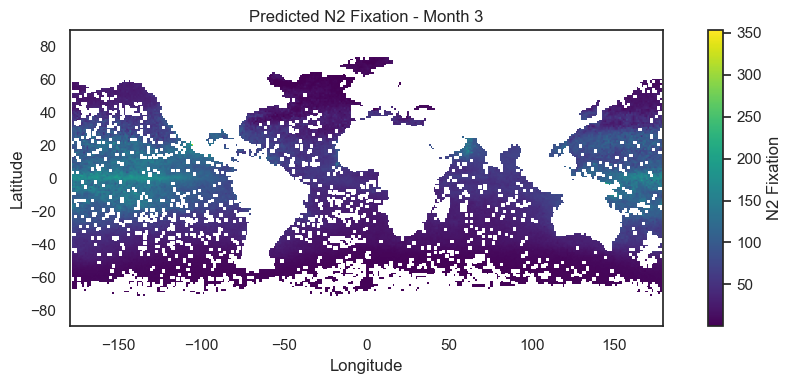

PAR_gridded/PAR_04.npz
SST_gridded/SST_04.npz
CHL_gridded/CHL_04.npz
MLD_gridded/MLD_04.npz
Salinity_gridded/Salinity_04.npz
DO_gridded/DO_04.npz
nitrate_gridded/nitrate_04.npz
phosphate_gridded/phosphate_04.npz
Fe_gridded/Fe_04.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


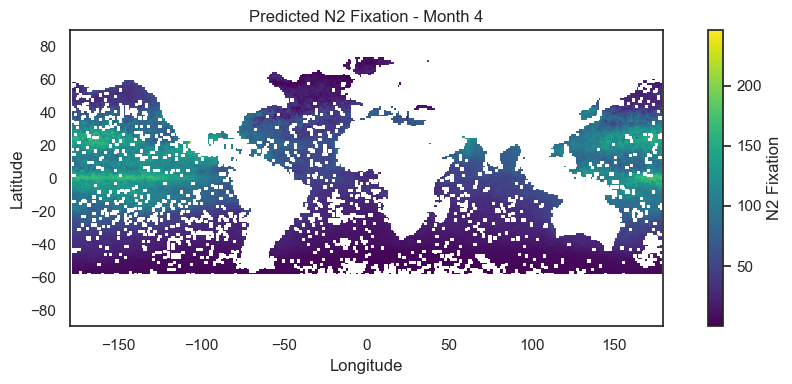

PAR_gridded/PAR_05.npz
SST_gridded/SST_05.npz
CHL_gridded/CHL_05.npz
MLD_gridded/MLD_05.npz
Salinity_gridded/Salinity_05.npz
DO_gridded/DO_05.npz
nitrate_gridded/nitrate_05.npz
phosphate_gridded/phosphate_05.npz
Fe_gridded/Fe_05.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


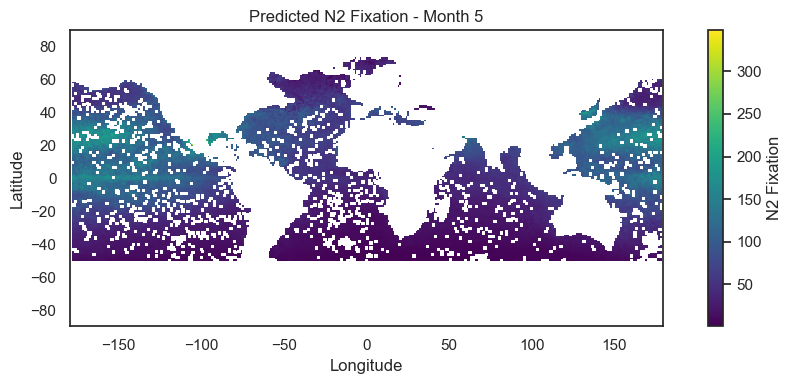

PAR_gridded/PAR_06.npz
SST_gridded/SST_06.npz
CHL_gridded/CHL_06.npz
MLD_gridded/MLD_06.npz
Salinity_gridded/Salinity_06.npz
DO_gridded/DO_06.npz
nitrate_gridded/nitrate_06.npz
phosphate_gridded/phosphate_06.npz
Fe_gridded/Fe_06.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


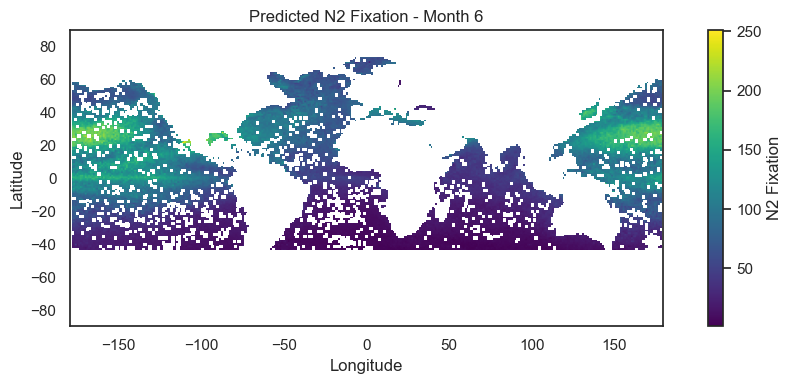

PAR_gridded/PAR_07.npz
SST_gridded/SST_07.npz
CHL_gridded/CHL_07.npz
MLD_gridded/MLD_07.npz
Salinity_gridded/Salinity_07.npz
DO_gridded/DO_07.npz
nitrate_gridded/nitrate_07.npz
phosphate_gridded/phosphate_07.npz
Fe_gridded/Fe_07.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


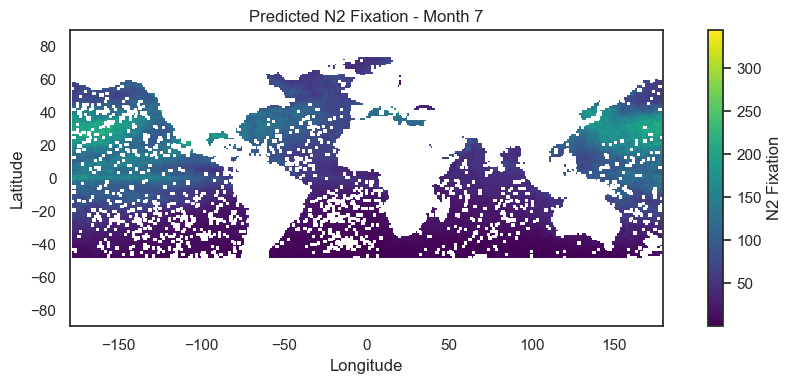

PAR_gridded/PAR_08.npz
SST_gridded/SST_08.npz
CHL_gridded/CHL_08.npz
MLD_gridded/MLD_08.npz
Salinity_gridded/Salinity_08.npz
DO_gridded/DO_08.npz
nitrate_gridded/nitrate_08.npz
phosphate_gridded/phosphate_08.npz
Fe_gridded/Fe_08.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


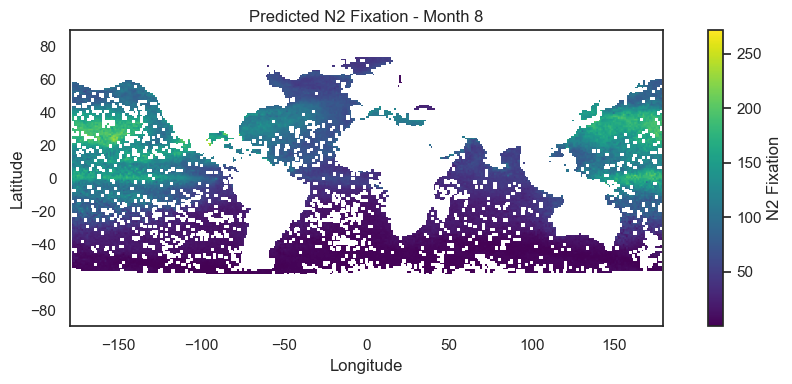

PAR_gridded/PAR_09.npz
SST_gridded/SST_09.npz
CHL_gridded/CHL_09.npz
MLD_gridded/MLD_09.npz
Salinity_gridded/Salinity_09.npz
DO_gridded/DO_09.npz
nitrate_gridded/nitrate_09.npz
phosphate_gridded/phosphate_09.npz
Fe_gridded/Fe_09.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


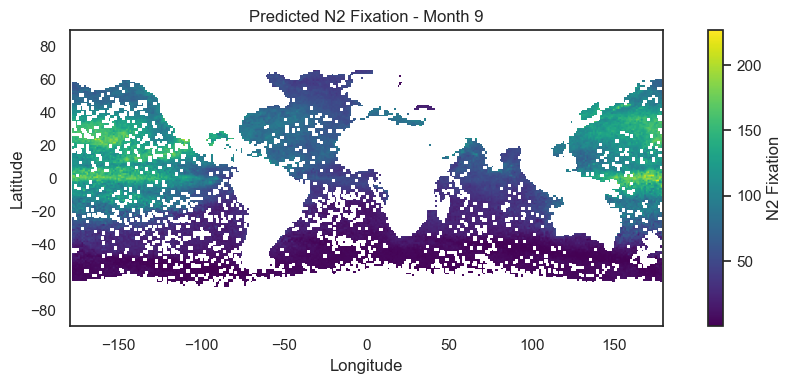

PAR_gridded/PAR_10.npz
SST_gridded/SST_10.npz
CHL_gridded/CHL_10.npz
MLD_gridded/MLD_10.npz
Salinity_gridded/Salinity_10.npz
DO_gridded/DO_10.npz
nitrate_gridded/nitrate_10.npz
phosphate_gridded/phosphate_10.npz
Fe_gridded/Fe_10.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


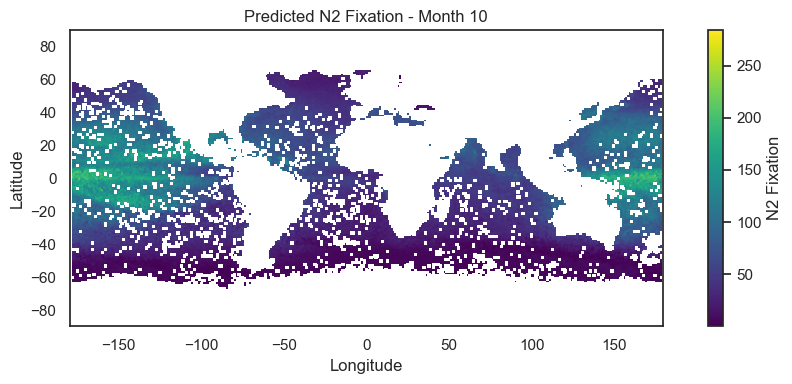

PAR_gridded/PAR_11.npz
SST_gridded/SST_11.npz
CHL_gridded/CHL_11.npz
MLD_gridded/MLD_11.npz
Salinity_gridded/Salinity_11.npz
DO_gridded/DO_11.npz
nitrate_gridded/nitrate_11.npz
phosphate_gridded/phosphate_11.npz
Fe_gridded/Fe_11.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


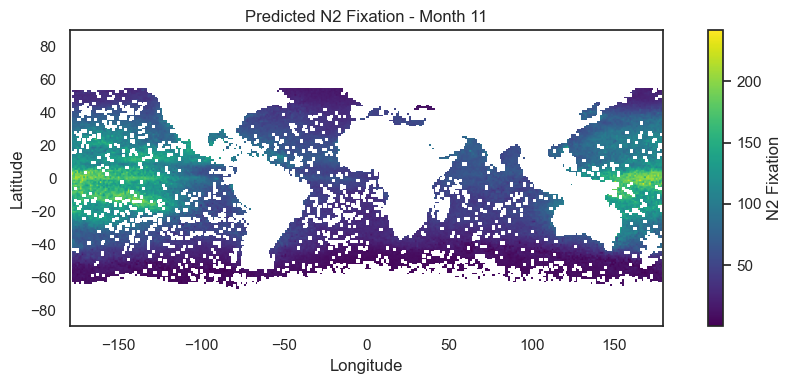

PAR_gridded/PAR_12.npz
SST_gridded/SST_12.npz
CHL_gridded/CHL_12.npz
MLD_gridded/MLD_12.npz
Salinity_gridded/Salinity_12.npz
DO_gridded/DO_12.npz
nitrate_gridded/nitrate_12.npz
phosphate_gridded/phosphate_12.npz
Fe_gridded/Fe_12.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


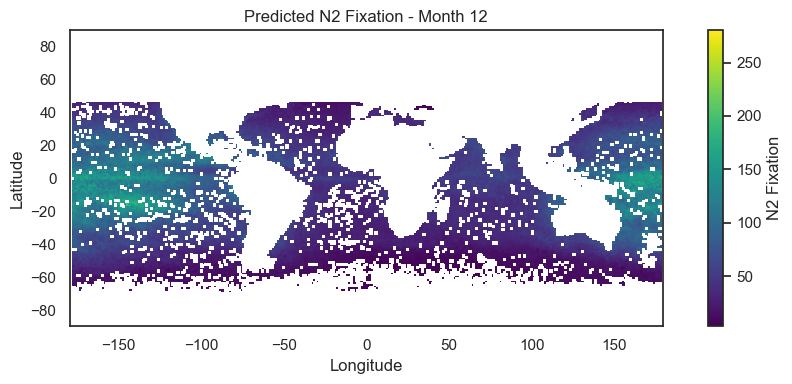

In [188]:
# === 2. 设置变量和路径 ===
var_names = ['PAR', 'SST', 'CHL', 'MLD', 'Salinity', 'DO', 'nitrate', 'phosphate', 'Fe']
input_folder = './'  # 假设每个变量一个子文件夹：CHL_gridded, PAR_gridded 等

target_lat = np.linspace(-89.5, 89.5, 180)
target_lon = np.linspace(-179.5, 179.5, 360)
lon_mesh, lat_mesh = np.meshgrid(target_lon, target_lat)

# === 3. 开始每月预测循环 ===
monthly_predictions = []

for month in range(1, 13):
    feature_stack = []

    for var in var_names:
        filepath = os.path.join(f"{var}_gridded", f"{var}_{month:02d}.npz")
        print(filepath)
        data = np.load(filepath)[var if var != 'CHL' else 'CHL']
        #print(data.shape)
        if data.shape != (180, 360):
            data = data.T
        if var == 'CHL':
            data = np.log10(data)  # log10变换
        feature_stack.append(data)

    # 转为 (N, 13) 的输入矩阵
    # 每个feature是 (180, 360)，展开成 (64800,)
    features = [f.ravel() for f in feature_stack]

    # 加入坐标特征
    coord1 = np.sin(np.radians(lat_mesh)).ravel()
    coord2 = (np.sin(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    coord3 = (-np.cos(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    time_cos = np.cos(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()
    time_sin = np.sin(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()

    # 拼接所有特征
    X = np.vstack(features + [coord1, coord2, coord3, time_sin, time_cos]).T  # shape (64800, 14)

    valid_mask = ~np.isnan(X).any(axis=1)  # shape=(64800,)

    # not NaN 
    X_valid = X[valid_mask]

    # 模型预测
    y_pred_log = linear_reg.predict(X_valid)
    #y_pred = np.power(10, y_pred_log)  # 还原 log10 -> 真实值

    full_pred_flat = np.full(180 * 360, np.nan)
    full_pred_flat[valid_mask] = np.power(10, y_pred_log)
    # 还原为2D地图
    pred_map = full_pred_flat.reshape(180, 360)

    monthly_predictions.append(pred_map)

    # 可视化
    plt.figure(figsize=(10, 4))
    plt.imshow(pred_map, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
    plt.colorbar(label='N2 Fixation')
    plt.title(f'Predicted N2 Fixation - Month {month}')
    plt.xlabel('Longitude'); plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()

/var/folders/hj/_2__yt6s2vd0smglfwx30m0w0000gn/T/ipykernel_74917/3078634241.py:2: RuntimeWarning: Mean of empty slice
  annual_avg = np.nanmean(np.stack(monthly_predictions), axis=0)


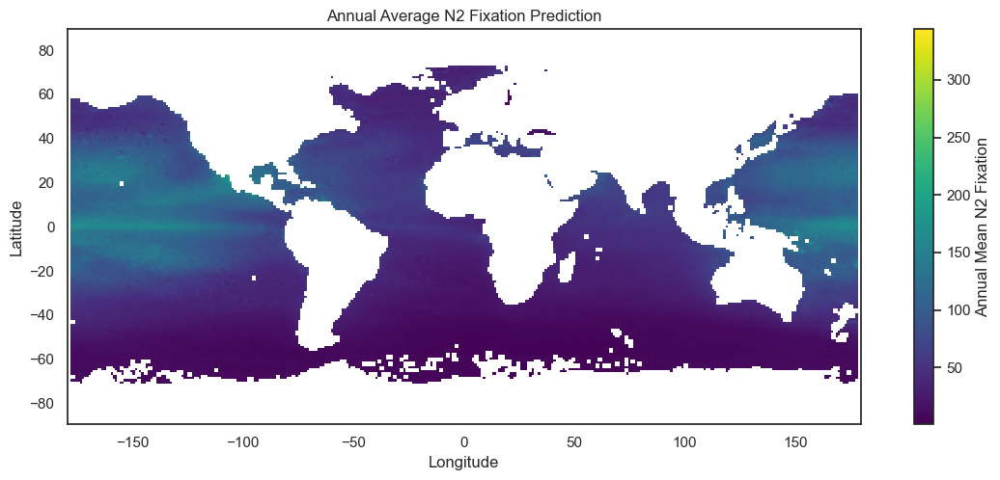

In [214]:
# === 4. 计算并画年平均图 ===
annual_avg = np.nanmean(np.stack(monthly_predictions), axis=0)

plt.figure(figsize=(12, 5))
plt.imshow(annual_avg, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
plt.colorbar(label='Annual Mean N2 Fixation')
plt.title('Annual Average N2 Fixation Prediction')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [209]:
#### ------- Fill with the neighborhood mean (3x3 grid) -------- ####
import numpy as np
from scipy.ndimage import generic_filter

def nanmean_filter(values):
    """计算非nan值的均值"""
    valid = values[~np.isnan(values)]
    return np.mean(valid) if valid.size > 0 else np.nan

# copy
annual_filled = annual_avg.copy()

# NaN mask
nan_mask = np.isnan(annual_filled)

# 3x3 sliding window
smoothed = generic_filter(annual_filled, nanmean_filter, size=3, mode='constant', cval=np.nan)

annual_filled[nan_mask] = smoothed[nan_mask]


In [215]:
# 第一次填充
filled_once = annual_avg.copy()
nan_mask1 = np.isnan(filled_once)
smoothed1 = generic_filter(filled_once, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_once[nan_mask1] = smoothed1[nan_mask1]

# 第二次填充
filled_twice = filled_once.copy()
nan_mask2 = np.isnan(filled_twice)
smoothed2 = generic_filter(filled_twice, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_twice[nan_mask2] = smoothed2[nan_mask2]

annual_filled = filled_twice

In [218]:
# grid
lat = np.linspace(-89.5, 89.5, 180)
lon = np.linspace(-179.5, 179.5, 360)
# save as .npz
np.savez('annual_lr.npz', lat=lat, lon=lon, n2fix=annual_filled)


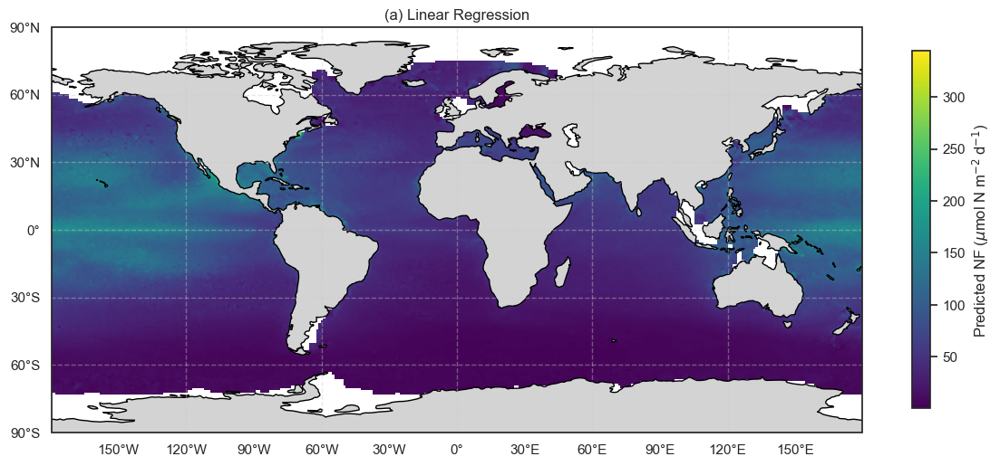

In [219]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt

proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=proj)

img = ax.imshow(
    annual_filled, 
    origin='lower', 
    cmap='viridis', 
    extent=[-179.5, 179.5, -89.5, 89.5], 
    transform=proj
)

# 加大陆边界
ax.coastlines(resolution='110m', linewidth=1)
#ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

# lon, lat
ax.set_xticks([-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150], crs=proj)
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=proj)

# label
ax.set_xticklabels(['150°W','120°W','90°W','60°W','30°W','0°','30°E','60°E','90°E','120°E','150°E'])
ax.set_yticklabels(['90°S','60°S','30°S','0°','30°N','60°N','90°N'])

ax.gridlines(draw_labels=False, linestyle='--', alpha=0.4)

# colorbar
cbar = plt.colorbar(img, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Predicted NF ($\mu$mol N m$^{-2}$ d$^{-1}$)')

plt.title('(a) Linear Regression')
plt.tight_layout()
plt.savefig("LR_map.png")
plt.show()


### Random Forest

PAR_gridded/PAR_01.npz
SST_gridded/SST_01.npz
CHL_gridded/CHL_01.npz
MLD_gridded/MLD_01.npz
Salinity_gridded/Salinity_01.npz
DO_gridded/DO_01.npz
nitrate_gridded/nitrate_01.npz
phosphate_gridded/phosphate_01.npz
Fe_gridded/Fe_01.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


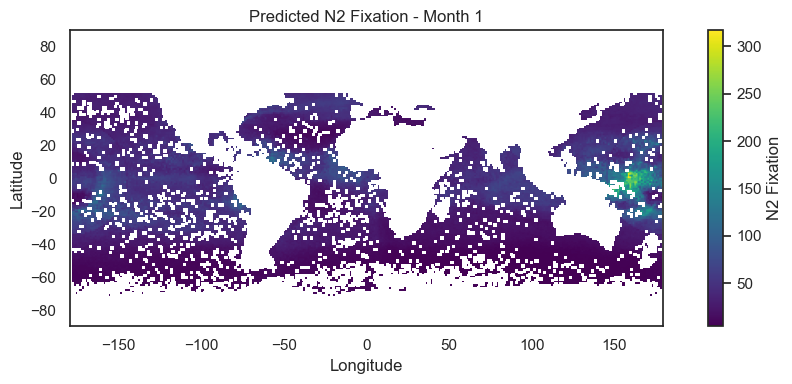

PAR_gridded/PAR_02.npz
SST_gridded/SST_02.npz
CHL_gridded/CHL_02.npz
MLD_gridded/MLD_02.npz
Salinity_gridded/Salinity_02.npz
DO_gridded/DO_02.npz
nitrate_gridded/nitrate_02.npz
phosphate_gridded/phosphate_02.npz
Fe_gridded/Fe_02.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


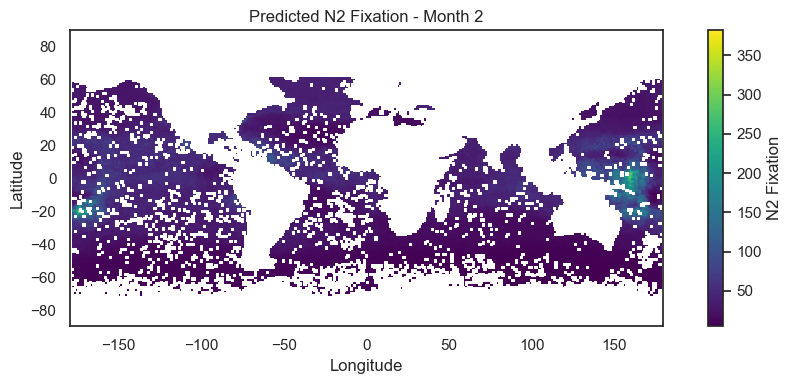

PAR_gridded/PAR_03.npz
SST_gridded/SST_03.npz
CHL_gridded/CHL_03.npz
MLD_gridded/MLD_03.npz
Salinity_gridded/Salinity_03.npz
DO_gridded/DO_03.npz
nitrate_gridded/nitrate_03.npz
phosphate_gridded/phosphate_03.npz
Fe_gridded/Fe_03.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


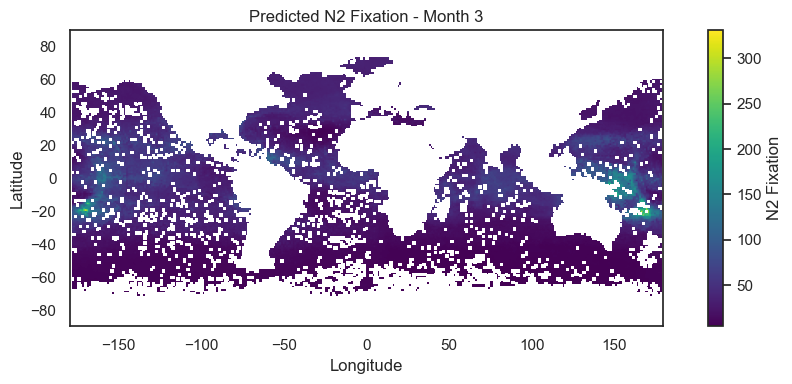

PAR_gridded/PAR_04.npz
SST_gridded/SST_04.npz
CHL_gridded/CHL_04.npz
MLD_gridded/MLD_04.npz
Salinity_gridded/Salinity_04.npz
DO_gridded/DO_04.npz
nitrate_gridded/nitrate_04.npz
phosphate_gridded/phosphate_04.npz
Fe_gridded/Fe_04.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


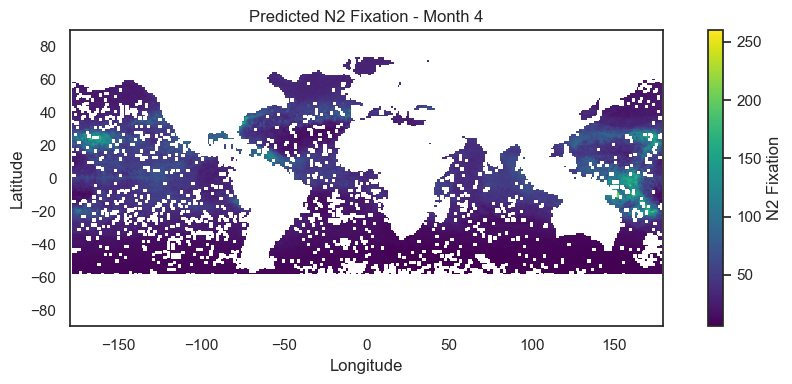

PAR_gridded/PAR_05.npz
SST_gridded/SST_05.npz
CHL_gridded/CHL_05.npz
MLD_gridded/MLD_05.npz
Salinity_gridded/Salinity_05.npz
DO_gridded/DO_05.npz
nitrate_gridded/nitrate_05.npz
phosphate_gridded/phosphate_05.npz
Fe_gridded/Fe_05.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


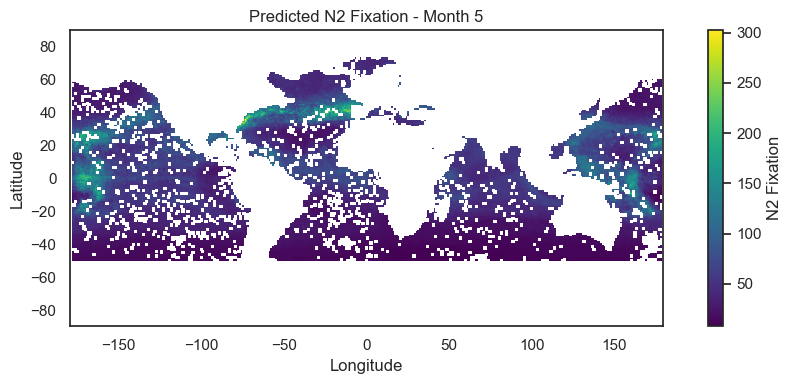

PAR_gridded/PAR_06.npz
SST_gridded/SST_06.npz
CHL_gridded/CHL_06.npz
MLD_gridded/MLD_06.npz
Salinity_gridded/Salinity_06.npz
DO_gridded/DO_06.npz
nitrate_gridded/nitrate_06.npz
phosphate_gridded/phosphate_06.npz
Fe_gridded/Fe_06.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


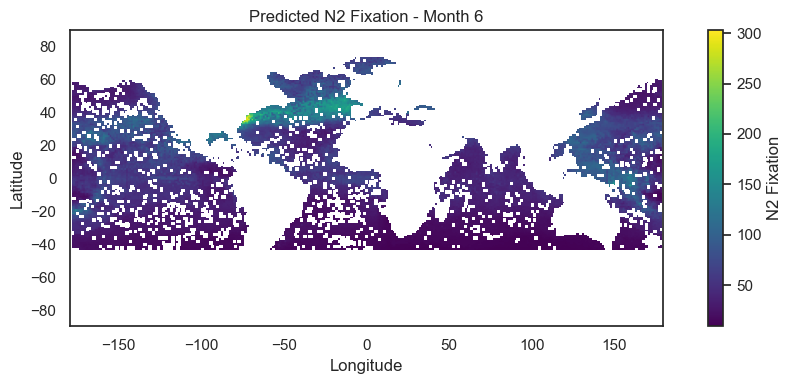

PAR_gridded/PAR_07.npz
SST_gridded/SST_07.npz
CHL_gridded/CHL_07.npz
MLD_gridded/MLD_07.npz
Salinity_gridded/Salinity_07.npz
DO_gridded/DO_07.npz
nitrate_gridded/nitrate_07.npz
phosphate_gridded/phosphate_07.npz
Fe_gridded/Fe_07.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


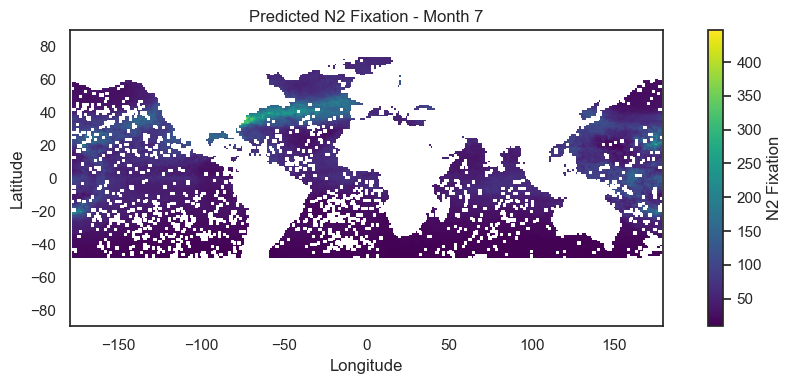

PAR_gridded/PAR_08.npz
SST_gridded/SST_08.npz
CHL_gridded/CHL_08.npz
MLD_gridded/MLD_08.npz
Salinity_gridded/Salinity_08.npz
DO_gridded/DO_08.npz
nitrate_gridded/nitrate_08.npz
phosphate_gridded/phosphate_08.npz
Fe_gridded/Fe_08.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


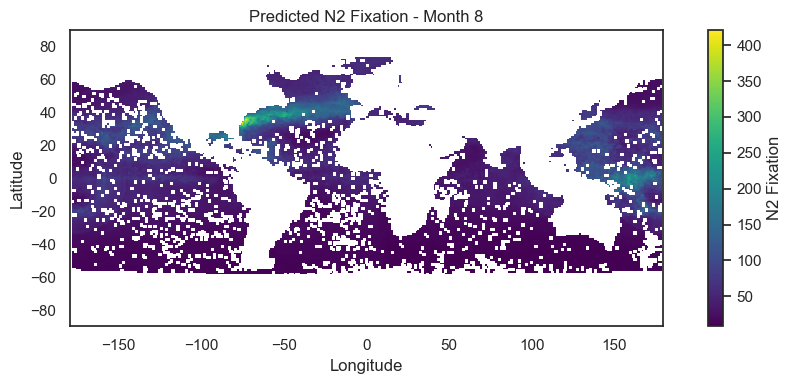

PAR_gridded/PAR_09.npz
SST_gridded/SST_09.npz
CHL_gridded/CHL_09.npz
MLD_gridded/MLD_09.npz
Salinity_gridded/Salinity_09.npz
DO_gridded/DO_09.npz
nitrate_gridded/nitrate_09.npz
phosphate_gridded/phosphate_09.npz
Fe_gridded/Fe_09.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


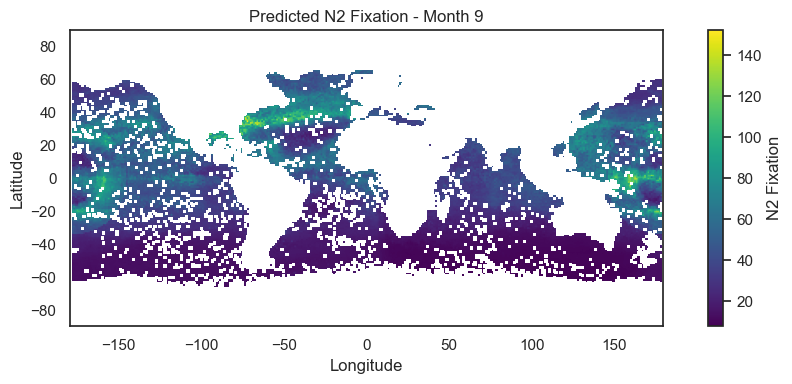

PAR_gridded/PAR_10.npz
SST_gridded/SST_10.npz
CHL_gridded/CHL_10.npz
MLD_gridded/MLD_10.npz
Salinity_gridded/Salinity_10.npz
DO_gridded/DO_10.npz
nitrate_gridded/nitrate_10.npz
phosphate_gridded/phosphate_10.npz
Fe_gridded/Fe_10.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


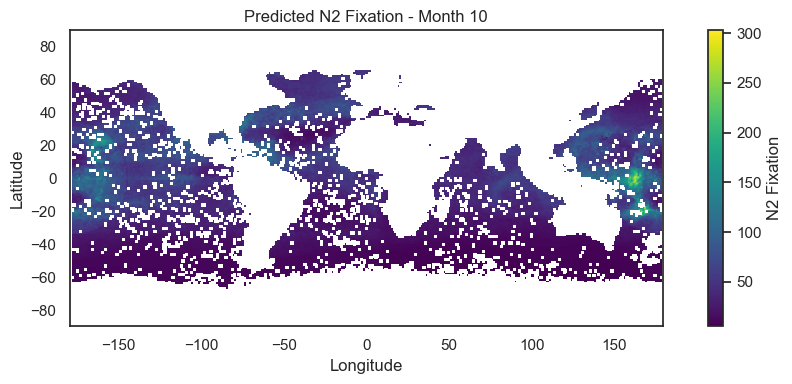

PAR_gridded/PAR_11.npz
SST_gridded/SST_11.npz
CHL_gridded/CHL_11.npz
MLD_gridded/MLD_11.npz
Salinity_gridded/Salinity_11.npz
DO_gridded/DO_11.npz
nitrate_gridded/nitrate_11.npz
phosphate_gridded/phosphate_11.npz
Fe_gridded/Fe_11.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


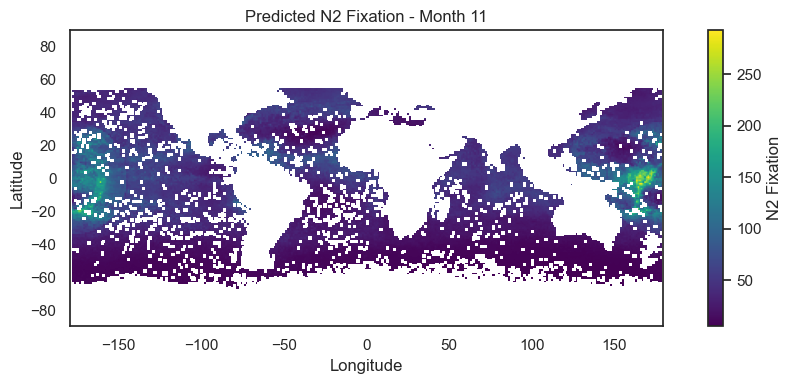

PAR_gridded/PAR_12.npz
SST_gridded/SST_12.npz
CHL_gridded/CHL_12.npz
MLD_gridded/MLD_12.npz
Salinity_gridded/Salinity_12.npz
DO_gridded/DO_12.npz
nitrate_gridded/nitrate_12.npz
phosphate_gridded/phosphate_12.npz
Fe_gridded/Fe_12.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


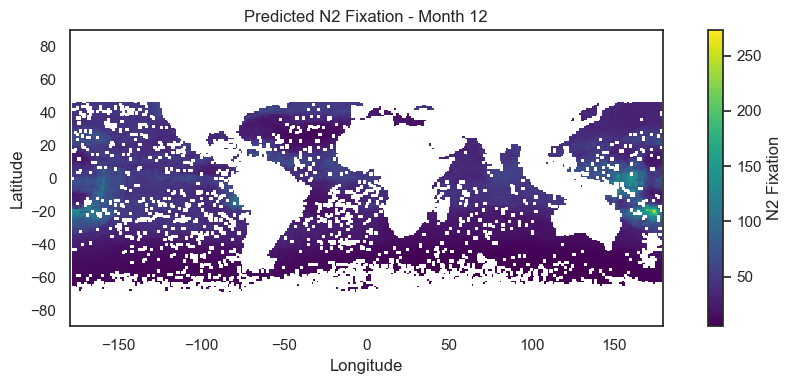

In [198]:
monthly_predictions_2 = []

for month in range(1, 13):
    feature_stack = []

    for var in var_names:
        filepath = os.path.join(f"{var}_gridded", f"{var}_{month:02d}.npz")
        print(filepath)
        data = np.load(filepath)[var if var != 'CHL' else 'CHL']
        #print(data.shape)
        if data.shape != (180, 360):
            data = data.T
        if var == 'CHL':
            data = np.log10(data)  # log10变换
        feature_stack.append(data)

    # 转为 (N, 13) 的输入矩阵
    # 每个feature是 (180, 360)，展开成 (64800,)
    features = [f.ravel() for f in feature_stack]

    # 加入坐标特征
    coord1 = np.sin(np.radians(lat_mesh)).ravel()
    coord2 = (np.sin(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    coord3 = (-np.cos(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    time_cos = np.cos(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()
    time_sin = np.sin(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()

    # 拼接所有特征
    X = np.vstack(features + [coord1, coord2, coord3, time_sin, time_cos]).T  # shape (64800, 14)

    valid_mask = ~np.isnan(X).any(axis=1)  # shape=(64800,)

    # not NaN 
    X_valid = X[valid_mask]

    # 模型预测
    y_pred_log = rf_model.predict(X_valid)
    #y_pred = np.power(10, y_pred_log)  # 还原 log10 -> 真实值

    full_pred_flat = np.full(180 * 360, np.nan)
    full_pred_flat[valid_mask] = np.power(10, y_pred_log)
    # 还原为2D地图
    pred_map = full_pred_flat.reshape(180, 360)

    monthly_predictions_2.append(pred_map)

    # vis
    plt.figure(figsize=(10, 4))
    plt.imshow(pred_map, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
    plt.colorbar(label='N2 Fixation')
    plt.title(f'Predicted N2 Fixation - Month {month}')
    plt.xlabel('Longitude'); plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()

/var/folders/hj/_2__yt6s2vd0smglfwx30m0w0000gn/T/ipykernel_74917/1633907379.py:1: RuntimeWarning: Mean of empty slice
  annual_avg_2 = np.nanmean(np.stack(monthly_predictions_2), axis=0)


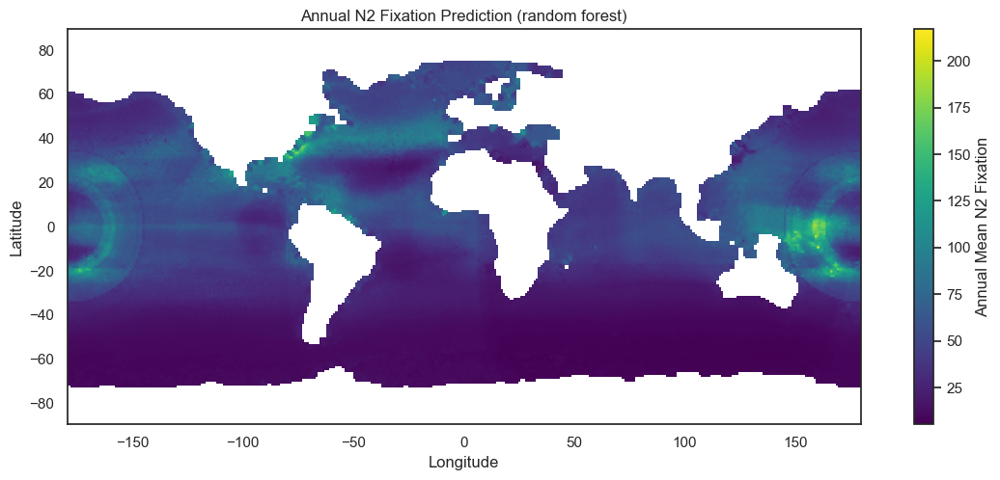

In [220]:
annual_avg_2 = np.nanmean(np.stack(monthly_predictions_2), axis=0)

# fill: 3x3 sliding window
filled_once = annual_avg_2.copy()
nan_mask1 = np.isnan(filled_once)
smoothed1 = generic_filter(filled_once, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_once[nan_mask1] = smoothed1[nan_mask1]

# 3x3 sliding window
filled_twice = filled_once.copy()
nan_mask2 = np.isnan(filled_twice)
smoothed2 = generic_filter(filled_twice, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_twice[nan_mask2] = smoothed2[nan_mask2]

annual_filled_2 = filled_twice

plt.figure(figsize=(12, 5))
plt.imshow(annual_filled_2, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
plt.colorbar(label='Annual Mean N2 Fixation')
plt.title('Annual N2 Fixation Prediction (random forest)')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [223]:
# grid
lat = np.linspace(-89.5, 89.5, 180)
lon = np.linspace(-179.5, 179.5, 360)
# save as .npz
np.savez('annual_rf.npz', lat=lat, lon=lon, n2fix=annual_filled_2)


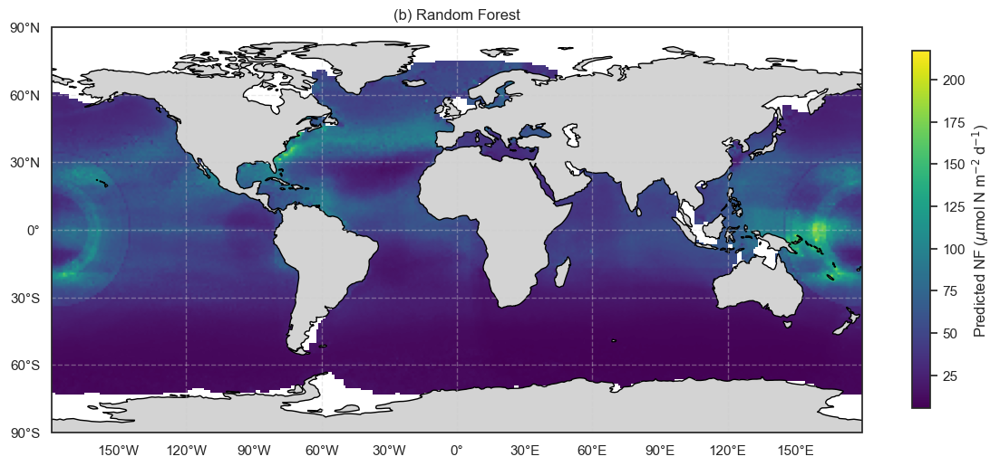

In [222]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt

proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=proj)

img = ax.imshow(
    annual_filled_2, 
    origin='lower', 
    cmap='viridis', 
    extent=[-179.5, 179.5, -89.5, 89.5], 
    transform=proj
)

# 加大陆边界
ax.coastlines(resolution='110m', linewidth=1)
#ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

# lon, lat
ax.set_xticks([-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150], crs=proj)
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=proj)

# label
ax.set_xticklabels(['150°W','120°W','90°W','60°W','30°W','0°','30°E','60°E','90°E','120°E','150°E'])
ax.set_yticklabels(['90°S','60°S','30°S','0°','30°N','60°N','90°N'])

ax.gridlines(draw_labels=False, linestyle='--', alpha=0.4)

# colorbar
cbar = plt.colorbar(img, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Predicted NF ($\mu$mol N m$^{-2}$ d$^{-1}$)')

plt.title('(b) Random Forest')
plt.tight_layout()
plt.savefig("RF_map.png")
plt.show()


### SVR

PAR_gridded/PAR_01.npz
SST_gridded/SST_01.npz
CHL_gridded/CHL_01.npz
MLD_gridded/MLD_01.npz
Salinity_gridded/Salinity_01.npz
DO_gridded/DO_01.npz
nitrate_gridded/nitrate_01.npz
phosphate_gridded/phosphate_01.npz
Fe_gridded/Fe_01.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


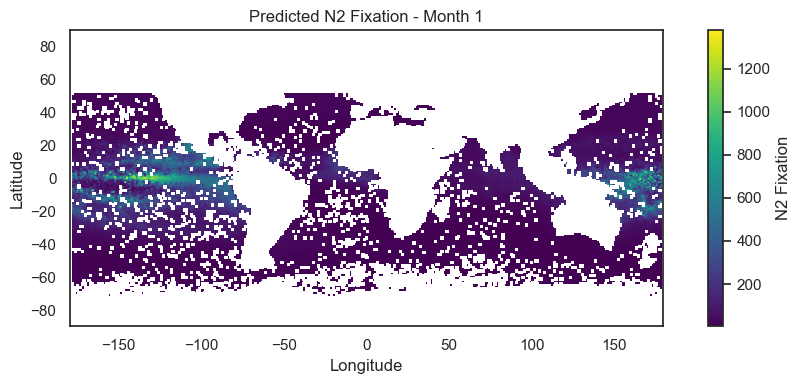

PAR_gridded/PAR_02.npz
SST_gridded/SST_02.npz
CHL_gridded/CHL_02.npz
MLD_gridded/MLD_02.npz
Salinity_gridded/Salinity_02.npz
DO_gridded/DO_02.npz
nitrate_gridded/nitrate_02.npz
phosphate_gridded/phosphate_02.npz
Fe_gridded/Fe_02.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


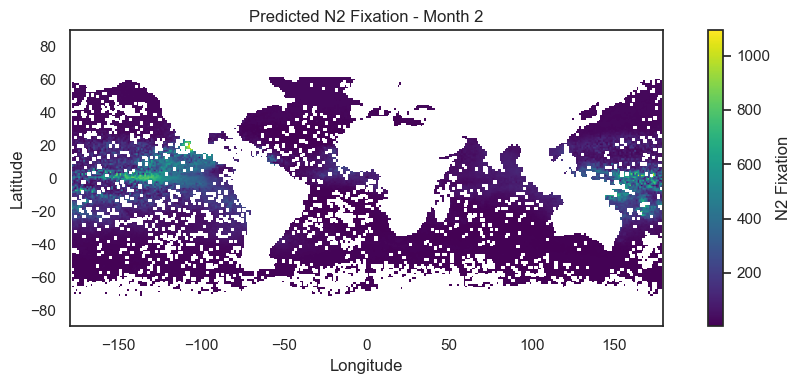

PAR_gridded/PAR_03.npz
SST_gridded/SST_03.npz
CHL_gridded/CHL_03.npz
MLD_gridded/MLD_03.npz
Salinity_gridded/Salinity_03.npz
DO_gridded/DO_03.npz
nitrate_gridded/nitrate_03.npz
phosphate_gridded/phosphate_03.npz
Fe_gridded/Fe_03.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


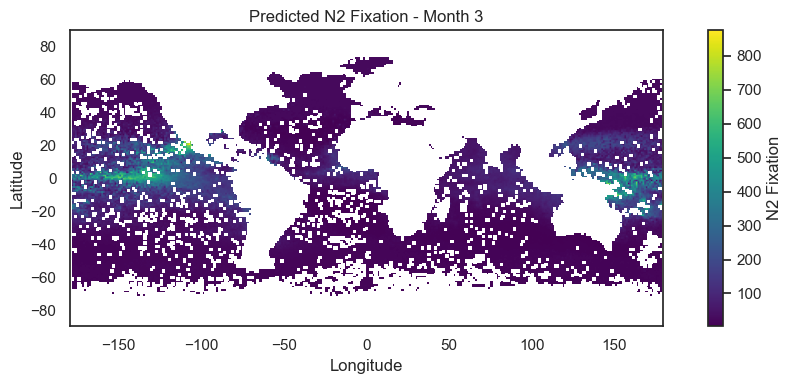

PAR_gridded/PAR_04.npz
SST_gridded/SST_04.npz
CHL_gridded/CHL_04.npz
MLD_gridded/MLD_04.npz
Salinity_gridded/Salinity_04.npz
DO_gridded/DO_04.npz
nitrate_gridded/nitrate_04.npz
phosphate_gridded/phosphate_04.npz
Fe_gridded/Fe_04.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


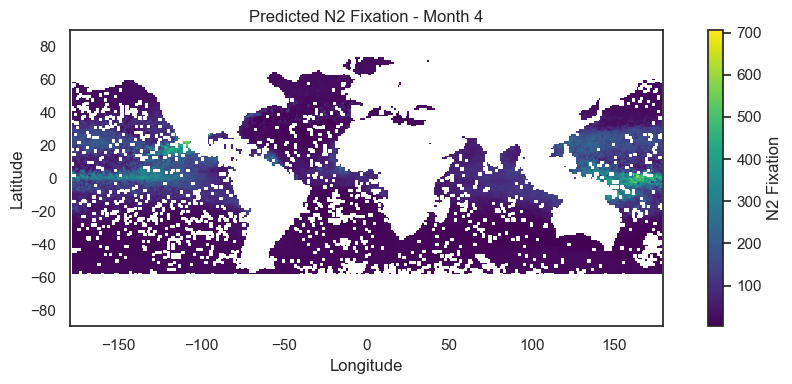

PAR_gridded/PAR_05.npz
SST_gridded/SST_05.npz
CHL_gridded/CHL_05.npz
MLD_gridded/MLD_05.npz
Salinity_gridded/Salinity_05.npz
DO_gridded/DO_05.npz
nitrate_gridded/nitrate_05.npz
phosphate_gridded/phosphate_05.npz
Fe_gridded/Fe_05.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


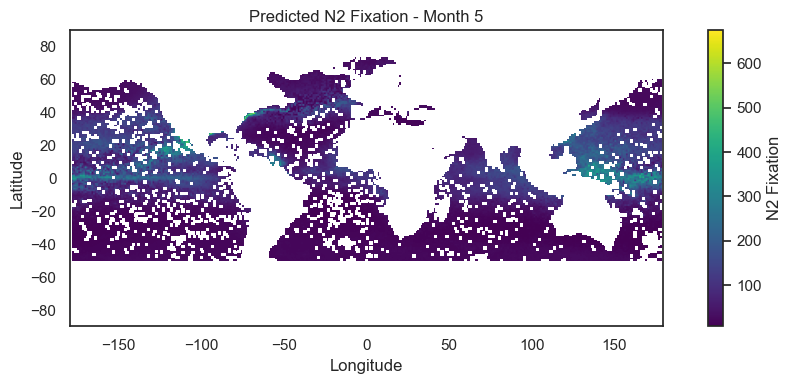

PAR_gridded/PAR_06.npz
SST_gridded/SST_06.npz
CHL_gridded/CHL_06.npz
MLD_gridded/MLD_06.npz
Salinity_gridded/Salinity_06.npz
DO_gridded/DO_06.npz
nitrate_gridded/nitrate_06.npz
phosphate_gridded/phosphate_06.npz
Fe_gridded/Fe_06.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


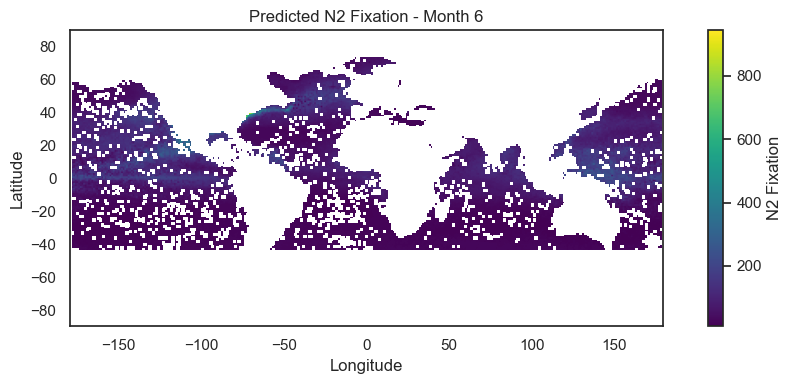

PAR_gridded/PAR_07.npz
SST_gridded/SST_07.npz
CHL_gridded/CHL_07.npz
MLD_gridded/MLD_07.npz
Salinity_gridded/Salinity_07.npz
DO_gridded/DO_07.npz
nitrate_gridded/nitrate_07.npz
phosphate_gridded/phosphate_07.npz
Fe_gridded/Fe_07.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


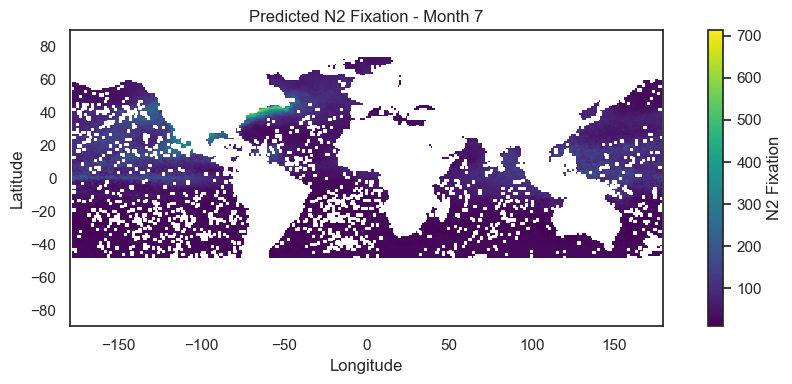

PAR_gridded/PAR_08.npz
SST_gridded/SST_08.npz
CHL_gridded/CHL_08.npz
MLD_gridded/MLD_08.npz
Salinity_gridded/Salinity_08.npz
DO_gridded/DO_08.npz
nitrate_gridded/nitrate_08.npz
phosphate_gridded/phosphate_08.npz
Fe_gridded/Fe_08.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


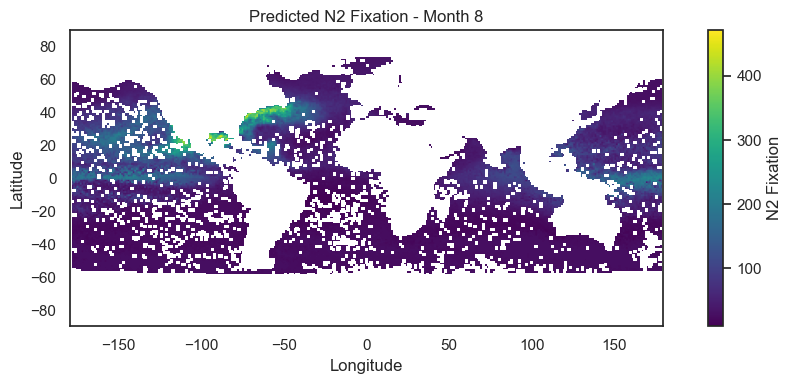

PAR_gridded/PAR_09.npz
SST_gridded/SST_09.npz
CHL_gridded/CHL_09.npz
MLD_gridded/MLD_09.npz
Salinity_gridded/Salinity_09.npz
DO_gridded/DO_09.npz
nitrate_gridded/nitrate_09.npz
phosphate_gridded/phosphate_09.npz
Fe_gridded/Fe_09.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


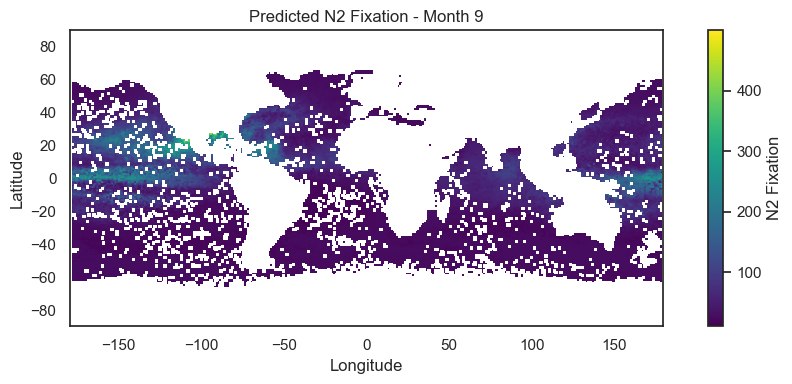

PAR_gridded/PAR_10.npz
SST_gridded/SST_10.npz
CHL_gridded/CHL_10.npz
MLD_gridded/MLD_10.npz
Salinity_gridded/Salinity_10.npz
DO_gridded/DO_10.npz
nitrate_gridded/nitrate_10.npz
phosphate_gridded/phosphate_10.npz
Fe_gridded/Fe_10.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


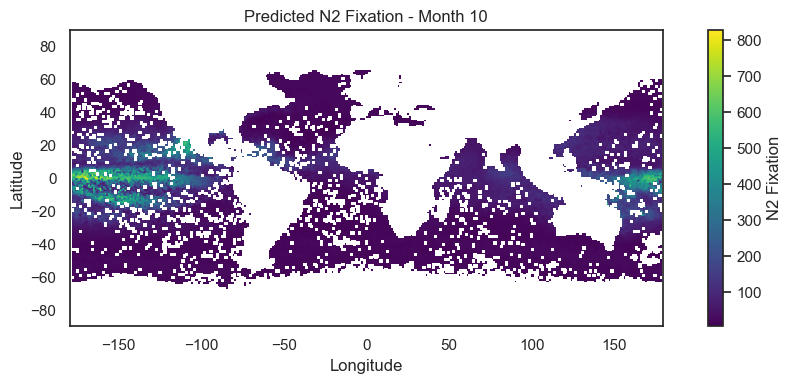

PAR_gridded/PAR_11.npz
SST_gridded/SST_11.npz
CHL_gridded/CHL_11.npz
MLD_gridded/MLD_11.npz
Salinity_gridded/Salinity_11.npz
DO_gridded/DO_11.npz
nitrate_gridded/nitrate_11.npz
phosphate_gridded/phosphate_11.npz
Fe_gridded/Fe_11.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


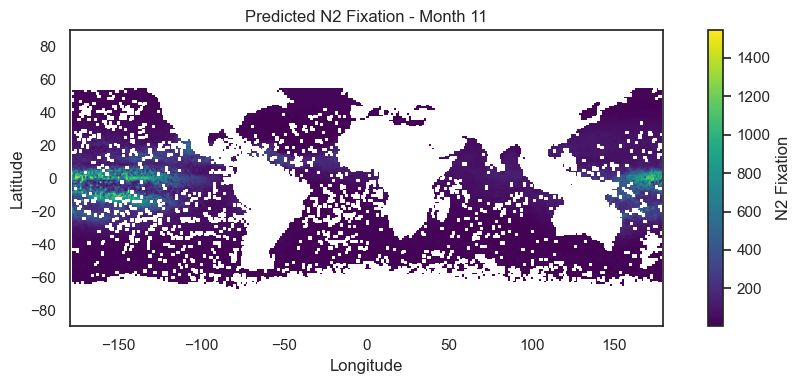

PAR_gridded/PAR_12.npz
SST_gridded/SST_12.npz
CHL_gridded/CHL_12.npz
MLD_gridded/MLD_12.npz
Salinity_gridded/Salinity_12.npz
DO_gridded/DO_12.npz
nitrate_gridded/nitrate_12.npz
phosphate_gridded/phosphate_12.npz
Fe_gridded/Fe_12.npz


/opt/anaconda3/envs/pytorch_env/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


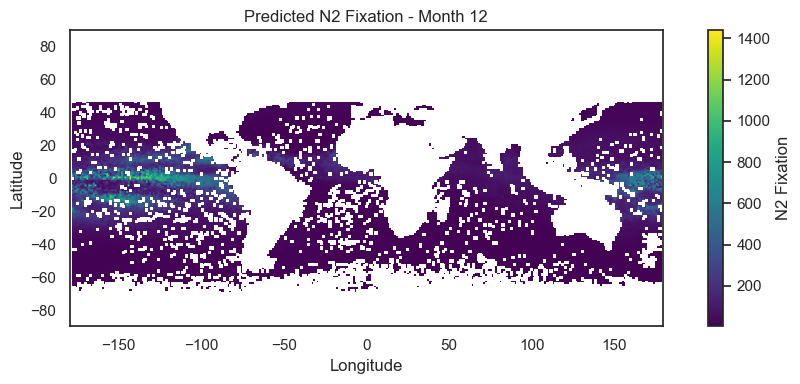

In [201]:
monthly_predictions_3 = []

for month in range(1, 13):
    feature_stack = []

    for var in var_names:
        filepath = os.path.join(f"{var}_gridded", f"{var}_{month:02d}.npz")
        print(filepath)
        data = np.load(filepath)[var if var != 'CHL' else 'CHL']
        #print(data.shape)
        if data.shape != (180, 360):
            data = data.T
        if var == 'CHL':
            data = np.log10(data)  # log10变换
        feature_stack.append(data)

    # 转为 (N, 13) 的输入矩阵
    # 每个feature是 (180, 360)，展开成 (64800,)
    features = [f.ravel() for f in feature_stack]

    # 加入坐标特征
    coord1 = np.sin(np.radians(lat_mesh)).ravel()
    coord2 = (np.sin(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    coord3 = (-np.cos(np.radians(lon_mesh)) * np.cos(np.radians(lat_mesh))).ravel()
    time_cos = np.cos(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()
    time_sin = np.sin(2 * np.pi * month / 12) * np.ones((180, 360)).ravel()

    # 拼接所有特征
    X = np.vstack(features + [coord1, coord2, coord3, time_sin, time_cos]).T  # shape (64800, 14)

    valid_mask = ~np.isnan(X).any(axis=1)  # shape=(64800,)

    # not NaN 
    X_valid = X[valid_mask]

    # 模型预测
    y_pred_log = svr_model.predict(X_valid)
    #y_pred = np.power(10, y_pred_log)  # 还原 log10 -> 真实值

    full_pred_flat = np.full(180 * 360, np.nan)
    full_pred_flat[valid_mask] = np.power(10, y_pred_log)
    # 还原为2D地图
    pred_map = full_pred_flat.reshape(180, 360)

    monthly_predictions_3.append(pred_map)

    # vis
    plt.figure(figsize=(10, 4))
    plt.imshow(pred_map, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
    plt.colorbar(label='N2 Fixation')
    plt.title(f'Predicted N2 Fixation - Month {month}')
    plt.xlabel('Longitude'); plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()

/var/folders/hj/_2__yt6s2vd0smglfwx30m0w0000gn/T/ipykernel_74917/26227282.py:1: RuntimeWarning: Mean of empty slice
  annual_avg_3 = np.nanmean(np.stack(monthly_predictions_3), axis=0)


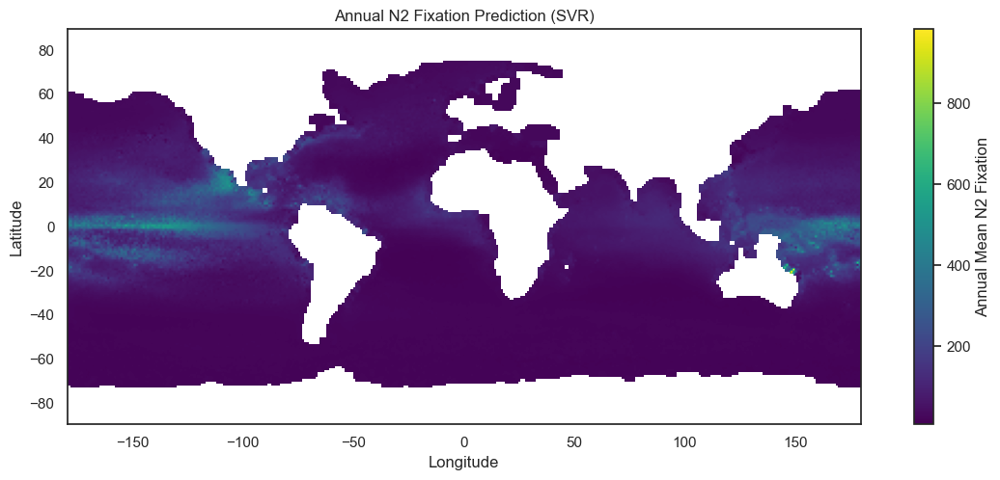

In [224]:
annual_avg_3 = np.nanmean(np.stack(monthly_predictions_3), axis=0)

# fill: 3x3 sliding window
filled_once = annual_avg_3.copy()
nan_mask1 = np.isnan(filled_once)
smoothed1 = generic_filter(filled_once, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_once[nan_mask1] = smoothed1[nan_mask1]

# 3x3 sliding window
filled_twice = filled_once.copy()
nan_mask2 = np.isnan(filled_twice)
smoothed2 = generic_filter(filled_twice, nanmean_filter, size=3, mode='constant', cval=np.nan)
filled_twice[nan_mask2] = smoothed2[nan_mask2]

annual_filled_3 = filled_twice

plt.figure(figsize=(12, 5))
plt.imshow(annual_filled_3, origin='lower', cmap='viridis', extent=[-179.5, 179.5, -89.5, 89.5])
plt.colorbar(label='Annual Mean N2 Fixation')
plt.title('Annual N2 Fixation Prediction (SVR)')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [226]:
# grid
lat = np.linspace(-89.5, 89.5, 180)
lon = np.linspace(-179.5, 179.5, 360)
# save as .npz
np.savez('annual_svr.npz', lat=lat, lon=lon, n2fix=annual_filled_3)


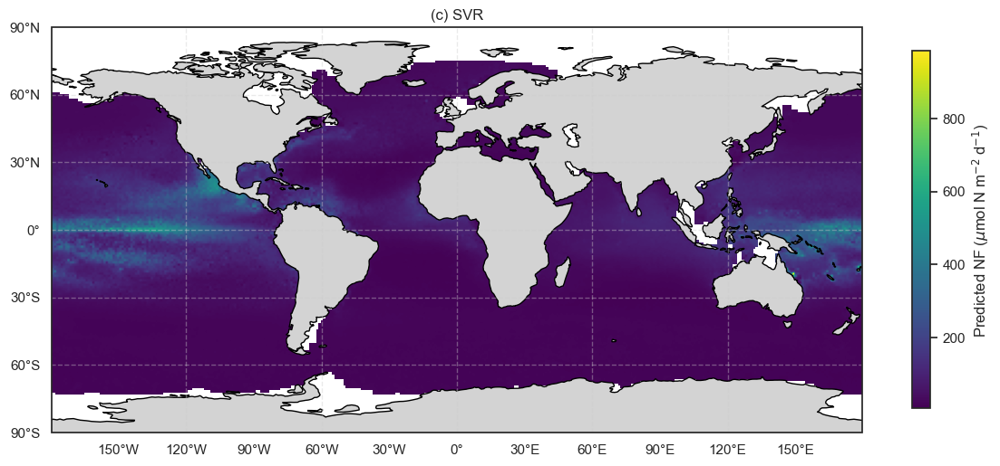

In [225]:
proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=proj)

img = ax.imshow(
    annual_filled_3, 
    origin='lower', 
    cmap='viridis', 
    extent=[-179.5, 179.5, -89.5, 89.5], 
    transform=proj
)

# 加大陆边界
ax.coastlines(resolution='110m', linewidth=1)
#ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

# lon, lat
ax.set_xticks([-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150], crs=proj)
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=proj)

# label
ax.set_xticklabels(['150°W','120°W','90°W','60°W','30°W','0°','30°E','60°E','90°E','120°E','150°E'])
ax.set_yticklabels(['90°S','60°S','30°S','0°','30°N','60°N','90°N'])

ax.gridlines(draw_labels=False, linestyle='--', alpha=0.4)

# colorbar
cbar = plt.colorbar(img, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Predicted NF ($\mu$mol N m$^{-2}$ d$^{-1}$)')

plt.title('(c) SVR')
plt.tight_layout()
plt.savefig("SVR_map.png")
plt.show()